In [443]:
import sys, os, random
import cv2
import numpy as np
from collections import OrderedDict

from sklearn.metrics import classification_report, confusion_matrix

import torch
import torchvision
from torch import nn, optim
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.nn.functional as F

from torchvision import datasets, transforms
from torchvision.transforms import ToTensor, GaussianBlur
import torchvision.models as models

import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline
%config IPCompleter.greedy=True
%config Completer.use_jedi = False

In [2]:
data_path = '../data'
arch_path = '%s/architecture' % data_path
cats_path = '%s/cats_and_dogs' % data_path

In [5]:
class_cts={}
for fn in os.listdir(arch_path):
    if '.' in fn:
        continue
    class_cts[fn.replace(' ','_').lower()] = len(os.listdir('%s/%s' % (arch_path, fn)))
class_cts

{'achaemenid_architecture': 392,
 'altar': 969,
 'american_craftsman_style': 364,
 'american_foursquare_architecture': 362,
 'ancient_egyptian_architecture': 406,
 'apse': 563,
 'art_deco_architecture': 566,
 'art_nouveau_architecture': 615,
 'baroque_architecture': 565,
 'bauhaus_architecture': 315,
 'beaux-arts_architecture': 424,
 'bell_tower': 1229,
 'byzantine_architecture': 313,
 'chicago_school_architecture': 278,
 'colonial_architecture': 371,
 'column': 2129,
 'deconstructivism': 335,
 'dome(inner)': 685,
 'dome(outer)': 1319,
 'edwardian_architecture': 280,
 'flying_buttress': 477,
 'gargoyle': 1811,
 'georgian_architecture': 381,
 'gothic_architecture': 331,
 'greek_revival_architecture': 523,
 'international_style': 417,
 'novelty_architecture': 382,
 'palladian_architecture': 343,
 'postmodern_architecture': 322,
 'queen_anne_architecture': 720,
 'romanesque_architecture': 301,
 'russian_revival_architecture': 352,
 'stained_glass': 1183,
 'tudor_revival_architecture': 455

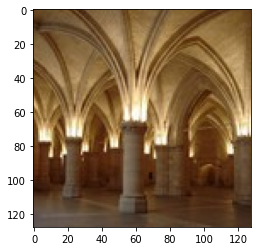

In [9]:
im = cv2.cvtColor(cv2.imread('%s/vault/280320176_465a668635_m.jpg' % arch_path), cv2.COLOR_BGR2RGB)
plt.imshow(im)
plt.show()

In [53]:
im_sizes = {}
bad_ims=[]
ttl=0
for cls in os.listdir(arch_path):
    if '.' in cls:
        continue
    print(cls)
    cls_p = '%s/%s' % (arch_path, cls)
    for fn in os.listdir(cls_p):
        ttl+=1
        if ttl%1000==0:
            print(ttl)
        
        fp = '%s/%s' % (cls_p, fn)
        try:
            im = cv2.imread(fp)
        except Exception as ex:
            print('couldnt open %s: %s' % (fp, str(ex)))
            bad_ims.append(fp)
            continue
        if im is None:
            print('couldnt open %s' % (fp))
            bad_ims.append(fp)
            continue
        sz = im.shape
        if sz not in im_sizes:
            im_sizes[sz]=[]
        im_sizes[sz].append('%s/%s' % (cls_p, fn))
len(im_sizes), len(bad_ims)

Achaemenid architecture
altar
1000
American craftsman style
American Foursquare architecture
2000
Ancient Egyptian architecture
apse
Art Deco architecture
3000
Art Nouveau architecture
4000
Baroque architecture
Bauhaus architecture
5000
Beaux-Arts architecture
bell_tower
6000
Byzantine architecture
Chicago school architecture
7000
Colonial architecture
column
8000
9000
Deconstructivism
10000
dome(inner)
dome(outer)
11000
12000
Edwardian architecture
flying_buttress
gargoyle
13000
14000
Georgian architecture
15000
Gothic architecture
Greek Revival architecture
International style
16000
Novelty architecture
Palladian architecture
17000
Postmodern architecture
Queen Anne architecture
18000
Romanesque architecture
Russian Revival architecture
stained_glass
19000
Tudor Revival architecture
20000
vault
21000


(3345, 0)

In [30]:
very_bad_ims = []
for bi in bad_ims:
    if '.jpg' in bi:
        if not os.path.exists(bi):
            continue
            
        try:
            shutil.move(bi, '../data/bad/%s' % os.path.basename(bi))
            print('moved', bi)
        except Exception as ex:
            print(ex)
            very_bad_ims.append(bi)
            continue
len(very_bad_ims)

moved ../data/architecture/apse/120px-Aakirke(26)Kirken_set_fra_sydst.jpg
moved ../data/architecture/apse/120px-Capella_de_Sant_Lltzer_(Barcelona)_-_1.jpg
moved ../data/architecture/apse/120px-Cillamayor_Santa_Mar¡a_Apsis_978.jpg
moved ../data/architecture/apse/120px-Cimorro_Catedral_µvila.jpg
moved ../data/architecture/apse/120px-Didvyžių_Šv._popiežiaus_Leono_II_bažnyčia.jpg
moved ../data/architecture/apse/120px-Esglsia_romnica_de_Santa_Maria_del_Cam¡_(Veciana)_02.jpg
moved ../data/architecture/apse/120px-Fgeltofta_kyrka_4.jpg
moved ../data/architecture/apse/120px-Guadamur_ermita_ bside1.jpg
moved ../data/architecture/apse/120px-Gkhems_kyrka_Exterior_Absid_2010-07-16_Bild_1.jpg
moved ../data/architecture/apse/120px-Gteve_kyrka_absid_4500.jpg
moved ../data/architecture/apse/120px-Igrexa_de_San_Bartolomu_de_Rebord ns,_Tui,_Galiza.jpg
moved ../data/architecture/apse/120px-Igrexa_de_San_Pedro_Fiz_de_Reim¢ndez._San_Fiz_de_Reim¢ndez,_Sarria_3.jpg
moved ../data/architecture/apse/120p

0

In [33]:
sz_sort = [(sz, len(im_sizes[sz])) for sz in sorted(im_sizes, key=lambda k: len(im_sizes[k]), reverse=True)]
sz_sort[:20]

[((128, 128, 3), 10124),
 ((600, 800, 3), 1435),
 ((64, 64, 3), 1395),
 ((600, 450, 3), 472),
 ((667, 1000, 3), 290),
 ((533, 800, 3), 282),
 ((750, 1000, 3), 238),
 ((480, 640, 3), 111),
 ((666, 1000, 3), 103),
 ((563, 1000, 3), 99),
 ((532, 800, 3), 89),
 ((531, 800, 3), 78),
 ((450, 800, 3), 76),
 ((536, 800, 3), 67),
 ((600, 400, 3), 62),
 ((1000, 667, 3), 61),
 ((600, 600, 3), 49),
 ((1000, 750, 3), 45),
 ((1000, 1000, 3), 40),
 ((735, 1000, 3), 39)]

In [54]:
for sz, fps in im_sizes.items():
    if sz[0]<128 or sz[1]<128:
        print(sz, len(fps))

(64, 64, 3) 1395
(120, 115, 3) 1
(90, 120, 3) 1
(101, 120, 3) 1
(125, 300, 3) 1
(80, 127, 3) 1
(120, 90, 3) 1


In [55]:
for sz, fps in im_sizes.items():
    if sz[0]<128 or sz[1]<128:
        print(sz, len(fps))
        for fp in fps:
            if not '.jpg' in fp:
                print('not jpg', fp)
                continue
            if not os.path.exists(fp):
                print('doesnt exist', fp)
                continue
            new_fp = '../data/too_small/%s' % os.path.basename(fp)
            print('moving small %s to %s' % (fp, new_fp))
            shutil.move(fp, new_fp)

(64, 64, 3) 1395
moving small ../data/architecture/altar/00947185-77b4-4ecf-85ed-bf139c7d5a1d.jpg to ../data/too_small/00947185-77b4-4ecf-85ed-bf139c7d5a1d.jpg
moving small ../data/architecture/altar/010c7d48-02ad-4663-ba27-9670d8ccff60.jpg to ../data/too_small/010c7d48-02ad-4663-ba27-9670d8ccff60.jpg
moving small ../data/architecture/altar/018420ac-b243-4d97-977b-f10d32121288.jpg to ../data/too_small/018420ac-b243-4d97-977b-f10d32121288.jpg
moving small ../data/architecture/altar/0624cbfa-c730-4876-9958-87bbdb4290fa.jpg to ../data/too_small/0624cbfa-c730-4876-9958-87bbdb4290fa.jpg
moving small ../data/architecture/altar/064ffa6f-8be6-404c-a661-8a3b1322c2ba.jpg to ../data/too_small/064ffa6f-8be6-404c-a661-8a3b1322c2ba.jpg
moving small ../data/architecture/altar/08547ad1-0012-4dc6-8317-31510e1495f4.jpg to ../data/too_small/08547ad1-0012-4dc6-8317-31510e1495f4.jpg
moving small ../data/architecture/altar/08da5999-824e-4786-b9ac-8eadc8e3e5df.jpg to ../data/too_small/08da5999-824e-4786-b9ac

moving small ../data/architecture/altar/7bbef535-adc5-4d34-9681-e51f10ccfef3.jpg to ../data/too_small/7bbef535-adc5-4d34-9681-e51f10ccfef3.jpg
moving small ../data/architecture/altar/7e0a8a51-6920-46af-b586-d50d858c262f.jpg to ../data/too_small/7e0a8a51-6920-46af-b586-d50d858c262f.jpg
moving small ../data/architecture/altar/7e90d3af-a77e-4c30-b018-c1ea3cad7630.jpg to ../data/too_small/7e90d3af-a77e-4c30-b018-c1ea3cad7630.jpg
moving small ../data/architecture/altar/7ec929e2-6d21-4b60-a0c1-ede6c375b7e6.jpg to ../data/too_small/7ec929e2-6d21-4b60-a0c1-ede6c375b7e6.jpg
moving small ../data/architecture/altar/7f021710-2c03-4b12-80a3-3661645c3979.jpg to ../data/too_small/7f021710-2c03-4b12-80a3-3661645c3979.jpg
moving small ../data/architecture/altar/84e0fd1f-42ff-4107-ad54-979476f0c976.jpg to ../data/too_small/84e0fd1f-42ff-4107-ad54-979476f0c976.jpg
moving small ../data/architecture/altar/851b6e95-8cdb-44d7-898e-903038d8943c.jpg to ../data/too_small/851b6e95-8cdb-44d7-898e-903038d8943c.jpg

moving small ../data/architecture/apse/apse (13).jpg to ../data/too_small/apse (13).jpg
moving small ../data/architecture/apse/apse (14).jpg to ../data/too_small/apse (14).jpg
moving small ../data/architecture/apse/apse (15).jpg to ../data/too_small/apse (15).jpg
moving small ../data/architecture/apse/apse (16).jpg to ../data/too_small/apse (16).jpg
moving small ../data/architecture/apse/apse (18).jpg to ../data/too_small/apse (18).jpg
moving small ../data/architecture/apse/apse (19).jpg to ../data/too_small/apse (19).jpg
moving small ../data/architecture/apse/apse (2).jpg to ../data/too_small/apse (2).jpg
moving small ../data/architecture/apse/apse (3).jpg to ../data/too_small/apse (3).jpg
moving small ../data/architecture/apse/apse (4).jpg to ../data/too_small/apse (4).jpg
moving small ../data/architecture/apse/apse (5).jpg to ../data/too_small/apse (5).jpg
moving small ../data/architecture/apse/apse (6).jpg to ../data/too_small/apse (6).jpg
moving small ../data/architecture/apse/aps

moving small ../data/architecture/bell_tower/36140385960_7bd09d3ef7_m.jpg to ../data/too_small/36140385960_7bd09d3ef7_m.jpg
moving small ../data/architecture/bell_tower/36146390690_9c843fe744_n.jpg to ../data/too_small/36146390690_9c843fe744_n.jpg
moving small ../data/architecture/bell_tower/36152446595_f426ff937a_m.jpg to ../data/too_small/36152446595_f426ff937a_m.jpg
moving small ../data/architecture/bell_tower/36357562812_b035fedee2_m.jpg to ../data/too_small/36357562812_b035fedee2_m.jpg
moving small ../data/architecture/bell_tower/36384716271_058c0ae458_m.jpg to ../data/too_small/36384716271_058c0ae458_m.jpg
moving small ../data/architecture/bell_tower/36390775621_5dffca6e89_m.jpg to ../data/too_small/36390775621_5dffca6e89_m.jpg
moving small ../data/architecture/bell_tower/36493078636_8790f699d2_m.jpg to ../data/too_small/36493078636_8790f699d2_m.jpg
moving small ../data/architecture/bell_tower/36641295876_299d3014e9_n.jpg to ../data/too_small/36641295876_299d3014e9_n.jpg
moving s

moving small ../data/architecture/bell_tower/descarga (9).jpg to ../data/too_small/descarga (9).jpg
moving small ../data/architecture/bell_tower/descarga.jpg to ../data/too_small/descarga.jpg
moving small ../data/architecture/bell_tower/df1d1923-e302-4f06-822a-9e5a65edcd90.jpg to ../data/too_small/df1d1923-e302-4f06-822a-9e5a65edcd90.jpg
moving small ../data/architecture/bell_tower/e0699ba5-12c5-4579-84cd-a3a400bcc813.jpg to ../data/too_small/e0699ba5-12c5-4579-84cd-a3a400bcc813.jpg
moving small ../data/architecture/bell_tower/e095c5cb-377a-4684-92ae-cd3e5cf37c82.jpg to ../data/too_small/e095c5cb-377a-4684-92ae-cd3e5cf37c82.jpg
moving small ../data/architecture/bell_tower/e12c2eaf-658f-4d92-87b5-ef1d24090f74.jpg to ../data/too_small/e12c2eaf-658f-4d92-87b5-ef1d24090f74.jpg
moving small ../data/architecture/bell_tower/e2992ae8-00d9-4761-94a0-c7b5baa8c1b4.jpg to ../data/too_small/e2992ae8-00d9-4761-94a0-c7b5baa8c1b4.jpg
moving small ../data/architecture/bell_tower/e9496d9a-4df9-4ae4-8cc9

moving small ../data/architecture/column/26ac72cb-de8d-4403-99e7-2ee3d57d049a.jpg to ../data/too_small/26ac72cb-de8d-4403-99e7-2ee3d57d049a.jpg
moving small ../data/architecture/column/27077912552_f0e766ed32_n.jpg to ../data/too_small/27077912552_f0e766ed32_n.jpg
moving small ../data/architecture/column/27596963443_4fc7f218e4_m.jpg to ../data/too_small/27596963443_4fc7f218e4_m.jpg
moving small ../data/architecture/column/27596967803_290b6eb6e3_m.jpg to ../data/too_small/27596967803_290b6eb6e3_m.jpg
moving small ../data/architecture/column/27596986223_a86c9e489f_m.jpg to ../data/too_small/27596986223_a86c9e489f_m.jpg
moving small ../data/architecture/column/27596999573_b73d22efd9_n.jpg to ../data/too_small/27596999573_b73d22efd9_n.jpg
moving small ../data/architecture/column/28108198682_ec60989b50.jpg to ../data/too_small/28108198682_ec60989b50.jpg
moving small ../data/architecture/column/28189659713_5243765ecc_m.jpg to ../data/too_small/28189659713_5243765ecc_m.jpg
moving small ../data

moving small ../data/architecture/column/descarga (1).jpg to ../data/too_small/descarga (1).jpg
moving small ../data/architecture/column/descarga (10).jpg to ../data/too_small/descarga (10).jpg
moving small ../data/architecture/column/descarga (11).jpg to ../data/too_small/descarga (11).jpg
moving small ../data/architecture/column/descarga (2).jpg to ../data/too_small/descarga (2).jpg
moving small ../data/architecture/column/descarga (6).jpg to ../data/too_small/descarga (6).jpg
moving small ../data/architecture/column/descarga (7).jpg to ../data/too_small/descarga (7).jpg
moving small ../data/architecture/column/descarga (8).jpg to ../data/too_small/descarga (8).jpg
moving small ../data/architecture/column/descarga.jpg to ../data/too_small/descarga.jpg
moving small ../data/architecture/column/e7a21aca-afaa-41ff-b930-5ff620a007ac.jpg to ../data/too_small/e7a21aca-afaa-41ff-b930-5ff620a007ac.jpg
moving small ../data/architecture/column/f21793d2-18ac-41ca-9731-c30bffff7709.jpg to ../data

moving small ../data/architecture/dome(inner)/205c57ce-40b1-4991-80e3-50a9f3b2c501.jpg to ../data/too_small/205c57ce-40b1-4991-80e3-50a9f3b2c501.jpg
moving small ../data/architecture/dome(inner)/22fbe809-17c8-404e-a256-554a09ff177f.jpg to ../data/too_small/22fbe809-17c8-404e-a256-554a09ff177f.jpg
moving small ../data/architecture/dome(inner)/34780631861_f2898aaf74_m.jpg to ../data/too_small/34780631861_f2898aaf74_m.jpg
moving small ../data/architecture/dome(inner)/35683641554_647eec9c43_n.jpg to ../data/too_small/35683641554_647eec9c43_n.jpg
moving small ../data/architecture/dome(inner)/35755864474_b2a24dd9b6_n.jpg to ../data/too_small/35755864474_b2a24dd9b6_n.jpg
moving small ../data/architecture/dome(inner)/35766417094_8a06f3c524_n.jpg to ../data/too_small/35766417094_8a06f3c524_n.jpg
moving small ../data/architecture/dome(inner)/35771868683_e082296c0c_n.jpg to ../data/too_small/35771868683_e082296c0c_n.jpg
moving small ../data/architecture/dome(inner)/35854501743_4171c90741_n.jpg to

moving small ../data/architecture/dome(outer)/2619b9ce-7f7e-42a3-ad26-4e82ebf53647.jpg to ../data/too_small/2619b9ce-7f7e-42a3-ad26-4e82ebf53647.jpg
moving small ../data/architecture/dome(outer)/27e1e7da-46e7-43d5-8431-8429f72c2ef0.jpg to ../data/too_small/27e1e7da-46e7-43d5-8431-8429f72c2ef0.jpg
moving small ../data/architecture/dome(outer)/288b9d58-eda0-4388-938a-5b660b8e0a9e.jpg to ../data/too_small/288b9d58-eda0-4388-938a-5b660b8e0a9e.jpg
moving small ../data/architecture/dome(outer)/2cfcc970-b05b-47cf-9b0d-678074680814.jpg to ../data/too_small/2cfcc970-b05b-47cf-9b0d-678074680814.jpg
moving small ../data/architecture/dome(outer)/307f69af-04d5-4030-b03f-41d6c5fba3f4.jpg to ../data/too_small/307f69af-04d5-4030-b03f-41d6c5fba3f4.jpg
moving small ../data/architecture/dome(outer)/34068873604_b035c5534e_m.jpg to ../data/too_small/34068873604_b035c5534e_m.jpg
moving small ../data/architecture/dome(outer)/34912011025_ddc0091a82.jpg to ../data/too_small/34912011025_ddc0091a82.jpg
moving sm

moving small ../data/architecture/dome(outer)/dome (12).jpg to ../data/too_small/dome (12).jpg
moving small ../data/architecture/dome(outer)/dome (13).jpg to ../data/too_small/dome (13).jpg
moving small ../data/architecture/dome(outer)/dome (2).jpg to ../data/too_small/dome (2).jpg
moving small ../data/architecture/dome(outer)/dome (3).jpg to ../data/too_small/dome (3).jpg
moving small ../data/architecture/dome(outer)/dome (4).jpg to ../data/too_small/dome (4).jpg
moving small ../data/architecture/dome(outer)/dome (5).jpg to ../data/too_small/dome (5).jpg
moving small ../data/architecture/dome(outer)/dome (8).jpg to ../data/too_small/dome (8).jpg
moving small ../data/architecture/dome(outer)/e3ef9ecf-f421-4b14-9814-0a8303130805.jpg to ../data/too_small/e3ef9ecf-f421-4b14-9814-0a8303130805.jpg
moving small ../data/architecture/dome(outer)/e4f7f5ac-3c75-4c32-b306-ee3204bb685c.jpg to ../data/too_small/e4f7f5ac-3c75-4c32-b306-ee3204bb685c.jpg
moving small ../data/architecture/dome(outer)/e

moving small ../data/architecture/flying_buttress/images (47).jpg to ../data/too_small/images (47).jpg
moving small ../data/architecture/flying_buttress/images (48).jpg to ../data/too_small/images (48).jpg
moving small ../data/architecture/flying_buttress/images (56).jpg to ../data/too_small/images (56).jpg
moving small ../data/architecture/flying_buttress/images (57).jpg to ../data/too_small/images (57).jpg
moving small ../data/architecture/flying_buttress/images (60).jpg to ../data/too_small/images (60).jpg
moving small ../data/architecture/flying_buttress/images (62).jpg to ../data/too_small/images (62).jpg
moving small ../data/architecture/flying_buttress/images (63).jpg to ../data/too_small/images (63).jpg
moving small ../data/architecture/flying_buttress/images (67).jpg to ../data/too_small/images (67).jpg
moving small ../data/architecture/flying_buttress/images (8).jpg to ../data/too_small/images (8).jpg
moving small ../data/architecture/flying_buttress/images (82).jpg to ../dat

moving small ../data/architecture/gargoyle/33536279934_db2a7cfcd9_n.jpg to ../data/too_small/33536279934_db2a7cfcd9_n.jpg
moving small ../data/architecture/gargoyle/33567908516_cfe1eb8522_m.jpg to ../data/too_small/33567908516_cfe1eb8522_m.jpg
moving small ../data/architecture/gargoyle/33623525173_2e411c4a92_n.jpg to ../data/too_small/33623525173_2e411c4a92_n.jpg
moving small ../data/architecture/gargoyle/33845023620_4535ed5fc7_n.jpg to ../data/too_small/33845023620_4535ed5fc7_n.jpg
moving small ../data/architecture/gargoyle/33908086171_4d3d9f0379_n.jpg to ../data/too_small/33908086171_4d3d9f0379_n.jpg
moving small ../data/architecture/gargoyle/33960820620_051b23823a_m.jpg to ../data/too_small/33960820620_051b23823a_m.jpg
moving small ../data/architecture/gargoyle/33989087582_c26162624b.jpg to ../data/too_small/33989087582_c26162624b.jpg
moving small ../data/architecture/gargoyle/34081516393_c0e20e5b21_m.jpg to ../data/too_small/34081516393_c0e20e5b21_m.jpg
moving small ../data/archite

moving small ../data/architecture/gargoyle/540ae186-0c59-4d32-b80f-86152b47a9a7.jpg to ../data/too_small/540ae186-0c59-4d32-b80f-86152b47a9a7.jpg
moving small ../data/architecture/gargoyle/55479f58-999c-48b6-aa42-a4bead88971a.jpg to ../data/too_small/55479f58-999c-48b6-aa42-a4bead88971a.jpg
moving small ../data/architecture/gargoyle/599ed432-2e89-42e6-93b7-747f6aba27a3.jpg to ../data/too_small/599ed432-2e89-42e6-93b7-747f6aba27a3.jpg
moving small ../data/architecture/gargoyle/5d5aabf6-f22c-4bd0-a8c7-b13d3de39482.jpg to ../data/too_small/5d5aabf6-f22c-4bd0-a8c7-b13d3de39482.jpg
moving small ../data/architecture/gargoyle/5ff1e5f6-32f6-4e6c-8418-b0e08b7225ed.jpg to ../data/too_small/5ff1e5f6-32f6-4e6c-8418-b0e08b7225ed.jpg
moving small ../data/architecture/gargoyle/60513ebe-2fb5-4331-ab38-c6ae2691d618.jpg to ../data/too_small/60513ebe-2fb5-4331-ab38-c6ae2691d618.jpg
moving small ../data/architecture/gargoyle/6116ee8e-66d7-4574-9dfe-5abdb01031ef.jpg to ../data/too_small/6116ee8e-66d7-4574-

moving small ../data/architecture/gargoyle/e3d31f87-1f07-45eb-931f-ba4cbe72b4b5.jpg to ../data/too_small/e3d31f87-1f07-45eb-931f-ba4cbe72b4b5.jpg
moving small ../data/architecture/gargoyle/e4467136-db1e-46aa-ac08-e54156bb8d7a.jpg to ../data/too_small/e4467136-db1e-46aa-ac08-e54156bb8d7a.jpg
moving small ../data/architecture/gargoyle/e5433f00-5b5c-4d0f-b913-c11ea4096521.jpg to ../data/too_small/e5433f00-5b5c-4d0f-b913-c11ea4096521.jpg
moving small ../data/architecture/gargoyle/e7a05bbc-ba78-4ba6-96b8-c81dc01d5a8b.jpg to ../data/too_small/e7a05bbc-ba78-4ba6-96b8-c81dc01d5a8b.jpg
moving small ../data/architecture/gargoyle/e88a6bb6-d305-480b-ac87-e3b094fe6097.jpg to ../data/too_small/e88a6bb6-d305-480b-ac87-e3b094fe6097.jpg
moving small ../data/architecture/gargoyle/e8f2f644-4cf1-46ed-b538-7a3f9bd1608b.jpg to ../data/too_small/e8f2f644-4cf1-46ed-b538-7a3f9bd1608b.jpg
moving small ../data/architecture/gargoyle/e96b39fa-38bb-40a5-befc-039868a7d788.jpg to ../data/too_small/e96b39fa-38bb-40a5-

moving small ../data/architecture/stained_glass/8d2013a1-ddb5-491c-95c9-0c9ac2ec898e.jpg to ../data/too_small/8d2013a1-ddb5-491c-95c9-0c9ac2ec898e.jpg
moving small ../data/architecture/stained_glass/8d695e50-5c17-4539-a206-1768534f1f8d.jpg to ../data/too_small/8d695e50-5c17-4539-a206-1768534f1f8d.jpg
moving small ../data/architecture/stained_glass/8f869a1b-8fc0-4571-8c99-0479a4983c86.jpg to ../data/too_small/8f869a1b-8fc0-4571-8c99-0479a4983c86.jpg
moving small ../data/architecture/stained_glass/8f905ec9-cb11-4aee-9596-51bec430f7d3.jpg to ../data/too_small/8f905ec9-cb11-4aee-9596-51bec430f7d3.jpg
moving small ../data/architecture/stained_glass/94151b5a-571e-460c-8390-219526dd3f55.jpg to ../data/too_small/94151b5a-571e-460c-8390-219526dd3f55.jpg
moving small ../data/architecture/stained_glass/9537c134-73db-4852-a8e2-9a19359fb659.jpg to ../data/too_small/9537c134-73db-4852-a8e2-9a19359fb659.jpg
moving small ../data/architecture/stained_glass/97aff6db-4583-4055-8319-c92b02a9d94d.jpg to ..

moving small ../data/architecture/vault/03c770fe-9bc1-4dd6-a924-85ae12b0099d.jpg to ../data/too_small/03c770fe-9bc1-4dd6-a924-85ae12b0099d.jpg
moving small ../data/architecture/vault/0b36caf3-685e-4b4d-849f-d4e27e1fbc4a.jpg to ../data/too_small/0b36caf3-685e-4b4d-849f-d4e27e1fbc4a.jpg
moving small ../data/architecture/vault/0cb7925a-41dd-4c47-9088-463a1a6ee4c1.jpg to ../data/too_small/0cb7925a-41dd-4c47-9088-463a1a6ee4c1.jpg
moving small ../data/architecture/vault/0d5b5daa-e137-4963-a556-2d34cb925d39.jpg to ../data/too_small/0d5b5daa-e137-4963-a556-2d34cb925d39.jpg
moving small ../data/architecture/vault/1437ad4b-db55-4181-9332-a2cb2ec75604.jpg to ../data/too_small/1437ad4b-db55-4181-9332-a2cb2ec75604.jpg
moving small ../data/architecture/vault/180a668c-a752-47f6-b41e-2f60fef7487b.jpg to ../data/too_small/180a668c-a752-47f6-b41e-2f60fef7487b.jpg
moving small ../data/architecture/vault/1ec20091-ab9a-4517-b2e8-ae4ced241ca3.jpg to ../data/too_small/1ec20091-ab9a-4517-b2e8-ae4ced241ca3.jpg

moving small ../data/architecture/vault/e96b75dd-9196-49dc-a34c-a7d244bc5f42.jpg to ../data/too_small/e96b75dd-9196-49dc-a34c-a7d244bc5f42.jpg
moving small ../data/architecture/vault/f016487b-2d17-45a0-8df6-f684f776b87a.jpg to ../data/too_small/f016487b-2d17-45a0-8df6-f684f776b87a.jpg
moving small ../data/architecture/vault/f2c8d56f-2401-46e5-bd84-c7a67e79c624.jpg to ../data/too_small/f2c8d56f-2401-46e5-bd84-c7a67e79c624.jpg
moving small ../data/architecture/vault/f3acda17-091a-42a6-8d3f-e62f8461073a.jpg to ../data/too_small/f3acda17-091a-42a6-8d3f-e62f8461073a.jpg
moving small ../data/architecture/vault/f64ecedc-0541-47b0-8541-ce99cb999637.jpg to ../data/too_small/f64ecedc-0541-47b0-8541-ce99cb999637.jpg
moving small ../data/architecture/vault/f6604d66-cf27-44ce-a9ae-0fc96a9dfbed.jpg to ../data/too_small/f6604d66-cf27-44ce-a9ae-0fc96a9dfbed.jpg
moving small ../data/architecture/vault/f9d9fd84-49c8-4cca-8fc8-f495d0b8bdce.jpg to ../data/too_small/f9d9fd84-49c8-4cca-8fc8-f495d0b8bdce.jpg

In [56]:
bad_kys = [k for k in im_sizes.keys() if k[0]<128 or k[1]<128]
len(bad_kys)

7

In [57]:
for bk in bad_kys:
    del im_sizes[bk]
bad_kys = [k for k in im_sizes.keys() if k[0]<128 or k[1]<128]
len(bad_kys)

0

In [44]:
im_sizes = {}
bad_ims=[]
ttl=0
for cls in os.listdir(arch_path):
    if '.' in cls:
        continue
    print(cls)
    cls_p = '%s/%s' % (arch_path, cls)
    for fn in os.listdir(cls_p):
        ttl+=1
        if ttl%1000==0:
            print(ttl)
        
        fp = '%s/%s' % (cls_p, fn)
        try:
            im = cv2.imread(fp)
        except Exception as ex:
            print('couldnt open %s: %s' % (fp, str(ex)))
            bad_ims.append(fp)
            continue
        if im is None:
            print('couldnt open %s' % (fp))
            bad_ims.append(fp)
            continue
        sz = im.shape
        if sz not in im_sizes:
            im_sizes[sz]=[]
        im_sizes[sz].append('%s/%s' % (cls, fn))
len(im_sizes), len(bad_ims)

Achaemenid architecture
altar
1000
American craftsman style
American Foursquare architecture
2000
Ancient Egyptian architecture
apse
Art Deco architecture
3000
Art Nouveau architecture
couldnt open ../data/architecture/Art Nouveau architecture/0_655px-Tenement%2C_ca._1910_by_arch._R._Grynus-Gajewski%2C_4_Debnicki_Market_Square%2C_Debniki%2C_Krakow%2C_Poland.jpg
couldnt open ../data/architecture/Art Nouveau architecture/23_800px-Agricultural_Society_building%2C_1909_by_arch._S%C5%82awomir_Odrzywolski%2C_8_Szczepanski_square%2C_Old_Town%2C_Krakow%2C_Poland.jpg
4000
Baroque architecture
Bauhaus architecture
5000
Beaux-Arts architecture
bell_tower
6000
Byzantine architecture
couldnt open ../data/architecture/Byzantine architecture/1661_800px-%D0%A3%D1%81%D0%BF%D0%B5%D0%BD%D1%81%D0%BA%D0%B8%D0%B9_%D1%81%D0%BE%D0%B1%D0%BE%D1%80_%28%D0%98%D0%B2%D0%B5%D1%80%D1%81%D0%BA%D0%B8%D0%B9_%D0%BC%D0%BE%D0%BD%D0%B0%D1%81%D1%82%D1%8B%D1%80%D1%8C%29.jpg
Chicago school architecture
7000
couldnt open ../dat

couldnt open ../data/architecture/Russian Revival architecture/3009_559px-%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D0%B9%D1%81%D0%BA%D0%B8%D0%B9_%D0%98%D1%81%D1%82%D0%BE%D1%80%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D0%B9_%D0%BC%D1%83%D0%B7%D0%B5%D0%B9.JPG
couldnt open ../data/architecture/Russian Revival architecture/438_442px-%D0%A5%D1%80%D0%B0%D0%BC_-_%D0%BF%D0%B0%D0%BC%D0%B5%D1%82%D0%BD%D0%B8%D0%BA_%D0%A0%D0%BE%D0%B6%D0%B4%D0%B5%D1%81%D1%82%D0%B2%D0%BE_%D0%A5%D1%80%D0%B8%D1%81%D1%82%D0%BE%D0%B2%D0%BE.jpg
couldnt open ../data/architecture/Russian Revival architecture/4600_800px-%D0%A1%D0%B0%D0%BC%D0%B0%D1%80%D1%81%D0%BA%D0%B8%D0%B9_%D0%94%D1%80%D0%B0%D0%BC%D0%B0%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D0%B9_%D1%82%D0%B5%D0%B0%D1%82%D1%80_2.JPG
couldnt open ../data/architecture/Russian Revival architecture/4607_800px-%D0%A1%D0%B0%D0%BC%D0%B0%D1%80%D1%81%D0%BA%D0%B8%D0%B9_%D0%B4%D1%80%D0%B0%D0%BC_%D1%82%D0%B5%D0%B0%D1%82%D1%80.jpg
couldnt open ../data/architecture/Russian Revival architecture/461

(3340, 42)

In [46]:
very_bad_ims = []
for bi in bad_ims:
    if not '.jpg' in bi:
        continue
        
    if not os.path.exists(bi):
        print('doesnt exist', bi)
        continue

    try:
        shutil.move(bi, '../data/bad/%s' % os.path.basename(bi))
        print('moved', bi)
    except Exception as ex:
        print(ex)
        very_bad_ims.append(bi)
        continue
len(very_bad_ims)

doesnt exist ../data/architecture/Art Nouveau architecture/0_655px-Tenement%2C_ca._1910_by_arch._R._Grynus-Gajewski%2C_4_Debnicki_Market_Square%2C_Debniki%2C_Krakow%2C_Poland.jpg
doesnt exist ../data/architecture/Art Nouveau architecture/23_800px-Agricultural_Society_building%2C_1909_by_arch._S%C5%82awomir_Odrzywolski%2C_8_Szczepanski_square%2C_Old_Town%2C_Krakow%2C_Poland.jpg
doesnt exist ../data/architecture/Byzantine architecture/1661_800px-%D0%A3%D1%81%D0%BF%D0%B5%D0%BD%D1%81%D0%BA%D0%B8%D0%B9_%D1%81%D0%BE%D0%B1%D0%BE%D1%80_%28%D0%98%D0%B2%D0%B5%D1%80%D1%81%D0%BA%D0%B8%D0%B9_%D0%BC%D0%BE%D0%BD%D0%B0%D1%81%D1%82%D1%8B%D1%80%D1%8C%29.jpg
doesnt exist ../data/architecture/Chicago school architecture/157_449px-Louis_Sullivan_-_Wainwright_Building%2C_Seventh_%2B_Chestnut_Streets%2C_Saint_Louis%2C_St._Louis_City_County%2C_MO.jpg
doesnt exist ../data/architecture/Deconstructivism/2658_800px-Seattle_Music_Project_by_architect_Frank_O._Gehry%2C_Seattle%2C_Washington_-_photo_by_Carol_M_Highs

0

In [86]:
to_del=[]
for sz, fps in im_sizes.items():
    if sz[0]<128 or sz[1]<128:
        to_del.append(sz)
        print(sz, len(fps))
len(to_del)

0

In [118]:
def resize_and_crop(im_sizes, orig_path):
    i=0
    for sz, fps in im_sizes.items():
        if sz[0]==128 and sz[1]==128:
            continue
            
        for p in fps:
            if not os.path.exists(p):
                continue
                
            i+=1
            if i%100==0:
                print(i, p)
            #if i>=5:
            #    break
                
            #print(p, sz)
            im = cv2.imread(p)
            
            #in case it was already resized
            sz = im.shape
            if sz[0]==128 and sz[1]==128:
                print('already resized', p)
                continue

            #resize
            wd = sz[0]
            ht = sz[1]
            
            if sz[0]>128 and sz[1]>128:
                #wd to 128, ht to new val
                if sz[0] < sz[1]:
                    wd = 128
                    ht = (128*sz[1])//sz[0]
                    #print('Resizing %d->%d, %d->%d' % (sz[0], wd, sz[1], ht))
                    im = cv2.resize(im, (ht, wd), interpolation = cv2.INTER_LINEAR)
                    #print('new im size', im.shape)
                #ht to 128, wd to new val
                else:
                    wd = (128*sz[0])//sz[1]
                    ht = 128
                    #print('Resizing %d->%d, %d->%d' % (sz[0], wd, sz[1], ht))
                    im = cv2.resize(im, (ht, wd), interpolation = cv2.INTER_LINEAR)
                    #print('new im size', im.shape)
                    
            #crop
            if wd>ht: #133 - 128 = 5//2 = 2 133-4
                side = math.ceil((wd - ht)/2)
                #print('Cropping width %d: 0:%d, %d:%d, %d:%d' % (wd, side, side+1, wd-side, wd-side+1, wd))
                im = im[side:, :, :]
                im = im[:128, :, :]
                #print('cropped im', im.shape)
            else:
                side = math.ceil((ht - wd)/2)
                #print('Cropping height %d: 0:%d, %d:%d, %d:%d' % (ht, side, side+1, ht-side, ht-side+1, ht))
                im = im[:, side:, :]
                im = im[:, :128, :]
                #print('cropped im', im.shape)
            
            #print('new im size', im.shape)
            
            if im.shape[0]==128 and im.shape[1]==128:
                cls, fn = p.split('/')[-2:]
                
                if not os.path.exists('%s/%s' % (orig_path, cls)):
                    os.mkdir('%s/%s' % (orig_path, cls))
                    
                #print('moving %s to %s/%s/%s' % (p, orig_path, cls, fn))
                shutil.move(p, '%s/%s/%s' % (orig_path, cls, fn))
                cv2.imwrite(p, im)
            else:
                print('image is wrong size')
                break
                
        #if i>=5:
        #    break

In [119]:
resize_and_crop(im_sizes, '../data/orig_sized')

already resized ../data/architecture/Achaemenid architecture/000000.jpg
already resized ../data/architecture/Achaemenid architecture/000002.jpg
already resized ../data/architecture/Achaemenid architecture/000003.jpg
already resized ../data/architecture/Achaemenid architecture/000004.jpg
100 ../data/architecture/Baroque architecture/003714.jpg
200 ../data/architecture/Bauhaus architecture/004168.jpg
300 ../data/architecture/Palladian architecture/011248.jpg
400 ../data/architecture/American craftsman style/153_800px-Bruns-Wynkoop_House.jpg
500 ../data/architecture/American craftsman style/757_800px-Cashmere%2C_WA_-_Cottage_Avenue_Historic_District_09.jpg
600 ../data/architecture/Ancient Egyptian architecture/3737_800px-Dahshur_RedPyramid_Egypt_2007feb1-22_byDanielCsorfoly.JPG
700 ../data/architecture/Art Deco architecture/4762_800px-Basiliqur_Nationale_du_Sacr%C3%A9-C%C5%93ur.JPG
800 ../data/architecture/Art Nouveau architecture/5671_800px-Torninkatu_4%2C_sis%C3%A4pihan_puoli.jpg
900 ..

In [25]:
def im_to_tensor(im_path, tensor_path, lab2idx, im_size=128, max_per_file=1000):
    im_arrays = []
    y=[]
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    #get all paths, shuffle, save 1000 per file
    paths = []
    for cls in os.listdir(im_path):
        if '.' in cls:
            continue
        cls_p = '%s/%s' % (im_path, cls)
        for fn in os.listdir(cls_p):
            paths.append('%s/%s' % (cls, fn))
    random.shuffle(paths)
    
    for i in range(0, len(paths), max_per_file):
        for cls_fn in paths[i:i+max_per_file]:
            cls, fn = cls_fn.split('/')
            c = cls.replace(' ','_').lower()
            fp = '%s/%s' % (im_path, cls_fn)
            im = cv2.cvtColor(cv2.imread(fp), cv2.COLOR_BGR2RGB)
            im_arrays.append(im)
            y.append(lab2idx[c])
        
        #shape (3 x H x W), where H and W are expected to be at least 224.
        # The images have to be loaded in to a range of [0, 1] and then normalized using
        # mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225].
        #im_arrays
        im_arrays = np.reshape(im_arrays, (-1, im_size, im_size, 3))
        
        im_arrays = torch.from_numpy(im_arrays)
        #normalize
        im_arrays = ((im_arrays/255)-mean)/std
        im_arrays = torch.swapaxes(im_arrays, 3, 1)
        print(im_arrays.shape)

        print('saving %s/x_%d.npy' % (tensor_path, i))
        torch.save(im_arrays, '%s/x_%d.pt' % (tensor_path, i))
        torch.save(torch.tensor(y), '%s/y_%d.pt' % (tensor_path, i))
        im_arrays=[]
        y=[]

In [3]:
data_path = '../data'
tensor_path = '%s/image_tensors' % data_path
lab2idx = {cls.replace(' ','_'):i for i,cls in enumerate(sorted([fn.lower() for fn in os.listdir(arch_path)]))}

In [26]:
im_to_tensor(arch_path, tensor_path, lab2idx, im_size=128, max_per_file=2000)

torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_0.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_2000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_4000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_6000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_8000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_10000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_12000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_14000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_16000.npy
torch.Size([2000, 3, 128, 128])
saving ../data/image_tensors/x_18000.npy
torch.Size([224, 3, 128, 128])
saving ../data/image_tensors/x_20000.npy


In [512]:
model = models.quantization.inception_v3(pretrained=True, aux_logits=False)
model.fc = nn.Linear(2048, len(lab2idx))
model

QuantizableInception3(
  (Conv2d_1a_3x3): QuantizableBasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (Conv2d_2a_3x3): QuantizableBasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (Conv2d_2b_3x3): QuantizableBasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): QuantizableBasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, tr

In [513]:
optimizer = optim.AdamW([
    {'params': model.fc.parameters(), 'lr': 1e-3},
    {'params': model.Mixed_7c.parameters(), 'lr': 1e-4},
    {'params': model.Mixed_7b.parameters(), 'lr': 1e-4},
    {'params': model.Mixed_7a.parameters(), 'lr': 1e-5},
    {'params': model.Mixed_6e.parameters(), 'lr': 1e-5},
    {'params': model.Mixed_6d.parameters(), 'lr': 1e-5},
    {'params': model.Mixed_6c.parameters(), 'lr': 1e-6},
    {'params': model.Mixed_6b.parameters(), 'lr': 1e-6},
    {'params': model.Mixed_6a.parameters(), 'lr': 1e-6},
    {'params': model.Mixed_5d.parameters(), 'lr': 1e-7},
    {'params': model.Mixed_5c.parameters(), 'lr': 1e-7},
    {'params': model.Mixed_5b.parameters(), 'lr': 1e-7}
], lr=1e-8)

In [514]:
def finetune_model(model, optimizer, tensor_path, model_path, lab2idx, device, batch_size=32, n_epochs=20):
    model.train()
    criterion = nn.CrossEntropyLoss()
    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=10)
    train_losses = []
    cv_losses = []
    
    if not os.path.exists(model_path):
        os.mkdir(model_path)
        
    xs = list(sorted([fn for fn in os.listdir(tensor_path) if 'x_' in fn and not '_0.' in fn]))
    ys = list(sorted([fn for fn in os.listdir(tensor_path) if 'y_' in fn and not '_0.' in fn]))    
    x_test = torch.load('%s/%s' % (tensor_path, xs[0]))
    y_test = torch.load('%s/%s' % (tensor_path, ys[0]))
    #half = x_test.size()[0]//2
    x_cv = torch.load('%s/%s' % (tensor_path, xs[1]))
    y_cv = torch.load('%s/%s' % (tensor_path, ys[1]))
    #x_test = x_test[half:]
    #y_test = y_test[half:]
    xs=xs[2:]
    ys=ys[2:]
    
    best_acc = 0
    
    for epoch in range(n_epochs):
        print('Epoch: %d' % epoch)
        
        idx = list(range(len(xs)))
        random.shuffle(idx)
        xs = [xs[i] for i in idx]
        ys = [ys[i] for i in idx]
        
        ep_ttl = 0
        for i in range(len(xs)):
            x = torch.load('%s/%s' % (tensor_path, xs[i]))
            y = torch.load('%s/%s' % (tensor_path, ys[i]))
            
            for j in range(0, x.size(0), batch_size):
                ep_ttl += 1
                x_batch = x[j:j+batch_size].to(device)
                y_batch = y[j:j+batch_size].to(device)
                
                #reset gradient for this iteration
                optimizer.zero_grad()

                #run the data through the model
                output = model(x_batch)

                #get the negative log likelihood loss
                loss = criterion(output, y_batch)

                #calculate the gradients
                loss.backward()

                #update the parameters from the gradients
                optimizer.step()
                
                if ep_ttl%100==0:
                    print('Epoch: %d, File: %s, Batch: %d, Loss: %.6f' % (epoch, xs[i], j, loss.item()))
                    train_losses.append(loss.item())
            
            ##### more testing, used to be at epoch level
            print('Testing model...')
            acc, cv_loss = test(model, criterion, x_cv, y_cv)
            scheduler.step(cv_loss)
            cv_losses.append(cv_loss)
            print('Test accuracy %.6f, prev best acc: %.6f %s' % (acc, best_acc, '!! IMPROVED !!' if acc>best_acc else ''))
        
            if acc>best_acc:
                best_acc = acc
                no_improvement = 0
                print('Saving model...')
                torch.save(model.state_dict(), '%s/model.pt' % model_path)
                torch.save(optimizer.state_dict(), '%s/optimizer.pt' % model_path)
            #else:
            #    no_improvement += 1

            #if no_improvement >= 40:
            #    print('no improvement in several epochs, breaking')
            #    break
            
    model.load_state_dict(torch.load('%s/model.pt' % model_path))
    test_acc, _ = test(model, criterion, x_test, y_test, lab2idx, True)
    print('final test accuracy: %.6f' % test_acc)
    model.eval()
    
    return model, train_losses, cv_losses

            
def test(model, criterion, x_test, y_test, lab2idx=None, print_report=False):
    model.eval()
    
    correct = 0
    loss = 0
    with torch.no_grad():
        output = model(x_test)
        
        loss = criterion(output, y_test)
        
        #select the indices of the maximum output values/prediction
        _, y_pred = torch.max(output, 1)

        #compare them with the target digits and sum correct predictions
        correct = y_pred.eq(y_test).sum()
        
    acc = correct / y_test.size()[0]
    
    print('Test accuracy %.6f, %d of %d' % (acc, correct, y_test.size()[0]))
    
    if print_report:
        idx2lab = {v:k for k,v in lab2idx.items()}
        class_labels = [idx2lab[i] for i in range(len(idx2lab))]
        
        print('\n\n')
        print(classification_report(y_test.tolist(), y_pred.tolist(), target_names=class_labels, digits=4))
        print('\n\n')
    
        cm = confusion_matrix(y_test.tolist(), y_pred.tolist())
        fig, ax = plt.subplots(figsize=(12,10))
        f = sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, ax=ax)
    
    model.train()
    
    return acc, loss.item()

In [516]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model_path = 'inception_model'

model, train_losses, cv_losses = finetune_model(model, optimizer, tensor_path, model_path, 
                                                lab2idx, device, batch_size=8, n_epochs=80)

Epoch: 0
Testing model...
Test accuracy 0.225500, 451 of 2000
Test accuracy 0.225500, prev best acc: 0.000000 !! IMPROVED !!
Saving model...
Epoch: 0, File: x_6000.pt, Batch: 568, Loss: 3.155993
Epoch: 0, File: x_6000.pt, Batch: 1368, Loss: 1.728056
Testing model...
Test accuracy 0.377500, 755 of 2000
Test accuracy 0.377500, prev best acc: 0.225500 !! IMPROVED !!
Saving model...
Epoch: 0, File: x_8000.pt, Batch: 168, Loss: 2.633679
Epoch: 0, File: x_8000.pt, Batch: 968, Loss: 2.345892
Epoch: 0, File: x_8000.pt, Batch: 1768, Loss: 1.524476
Testing model...
Test accuracy 0.442500, 885 of 2000
Test accuracy 0.442500, prev best acc: 0.377500 !! IMPROVED !!
Saving model...
Epoch: 0, File: x_4000.pt, Batch: 568, Loss: 1.937792
Epoch: 0, File: x_4000.pt, Batch: 1368, Loss: 1.717560
Testing model...
Test accuracy 0.453500, 907 of 2000
Test accuracy 0.453500, prev best acc: 0.442500 !! IMPROVED !!
Saving model...
Epoch: 0, File: x_14000.pt, Batch: 168, Loss: 3.286537
Epoch: 0, File: x_14000.pt,

Epoch: 4, File: x_18000.pt, Batch: 168, Loss: 0.032989
Epoch: 4, File: x_18000.pt, Batch: 968, Loss: 0.042820
Epoch: 4, File: x_18000.pt, Batch: 1768, Loss: 0.014288
Testing model...
Test accuracy 0.548000, 1096 of 2000
Test accuracy 0.548000, prev best acc: 0.552000 
Epoch: 4, File: x_6000.pt, Batch: 568, Loss: 0.074004
Epoch: 4, File: x_6000.pt, Batch: 1368, Loss: 0.021439
Testing model...
Test accuracy 0.521000, 1042 of 2000
Test accuracy 0.521000, prev best acc: 0.552000 
Epoch: 4, File: x_2000.pt, Batch: 168, Loss: 0.091043
Epoch: 4, File: x_2000.pt, Batch: 968, Loss: 0.005142
Epoch: 4, File: x_2000.pt, Batch: 1768, Loss: 0.004446
Testing model...
Test accuracy 0.521000, 1042 of 2000
Test accuracy 0.521000, prev best acc: 0.552000 
Epoch: 4, File: x_4000.pt, Batch: 568, Loss: 0.053642
Epoch: 4, File: x_4000.pt, Batch: 1368, Loss: 0.019728
Testing model...
Test accuracy 0.509500, 1019 of 2000
Test accuracy 0.509500, prev best acc: 0.552000 
Epoch: 5
Epoch: 5, File: x_16000.pt, Batc

Test accuracy 0.551500, 1103 of 2000
Test accuracy 0.551500, prev best acc: 0.553000 
Epoch: 9, File: x_6000.pt, Batch: 392, Loss: 0.004187
Epoch: 9, File: x_6000.pt, Batch: 1192, Loss: 0.015740
Epoch: 9, File: x_6000.pt, Batch: 1992, Loss: 0.118900
Testing model...
Test accuracy 0.522000, 1044 of 2000
Test accuracy 0.522000, prev best acc: 0.553000 
Epoch: 9, File: x_14000.pt, Batch: 792, Loss: 0.003170
Epoch: 9, File: x_14000.pt, Batch: 1592, Loss: 0.004126
Testing model...
Test accuracy 0.552500, 1105 of 2000
Test accuracy 0.552500, prev best acc: 0.553000 
Testing model...
Test accuracy 0.528000, 1056 of 2000
Test accuracy 0.528000, prev best acc: 0.553000 
Epoch: 9, File: x_16000.pt, Batch: 168, Loss: 0.127827
Epoch: 9, File: x_16000.pt, Batch: 968, Loss: 0.093532
Epoch: 9, File: x_16000.pt, Batch: 1768, Loss: 0.055730
Testing model...
Test accuracy 0.541000, 1082 of 2000
Test accuracy 0.541000, prev best acc: 0.553000 
Epoch: 9, File: x_18000.pt, Batch: 568, Loss: 0.022808
Epoch:

Test accuracy 0.551500, 1103 of 2000
Test accuracy 0.551500, prev best acc: 0.553000 
Epoch: 13, File: x_16000.pt, Batch: 168, Loss: 0.102523
Epoch: 13, File: x_16000.pt, Batch: 968, Loss: 0.030945
Epoch: 13, File: x_16000.pt, Batch: 1768, Loss: 0.027730
Testing model...
Test accuracy 0.542000, 1084 of 2000
Test accuracy 0.542000, prev best acc: 0.553000 
Epoch: 13, File: x_4000.pt, Batch: 568, Loss: 0.082225
Epoch: 13, File: x_4000.pt, Batch: 1368, Loss: 0.222374
Testing model...
Test accuracy 0.510000, 1020 of 2000
Test accuracy 0.510000, prev best acc: 0.553000 
Epoch: 14
Epoch: 14, File: x_4000.pt, Batch: 792, Loss: 0.058934
Epoch: 14, File: x_4000.pt, Batch: 1592, Loss: 0.041671
Testing model...
Test accuracy 0.510000, 1020 of 2000
Test accuracy 0.510000, prev best acc: 0.553000 
Epoch: 14, File: x_18000.pt, Batch: 392, Loss: 0.035121
Epoch: 14, File: x_18000.pt, Batch: 1192, Loss: 0.002028
Epoch: 14, File: x_18000.pt, Batch: 1992, Loss: 0.004721
Testing model...
Test accuracy 0.5

Epoch: 18, File: x_2000.pt, Batch: 792, Loss: 0.059476
Epoch: 18, File: x_2000.pt, Batch: 1592, Loss: 0.012222
Testing model...
Test accuracy 0.518500, 1037 of 2000
Test accuracy 0.518500, prev best acc: 0.553000 
Testing model...
Test accuracy 0.523000, 1046 of 2000
Test accuracy 0.523000, prev best acc: 0.553000 
Epoch: 18, File: x_4000.pt, Batch: 168, Loss: 0.018641
Epoch: 18, File: x_4000.pt, Batch: 968, Loss: 0.021090
Epoch: 18, File: x_4000.pt, Batch: 1768, Loss: 0.358527
Testing model...
Test accuracy 0.509500, 1019 of 2000
Test accuracy 0.509500, prev best acc: 0.553000 
Epoch: 18, File: x_8000.pt, Batch: 568, Loss: 0.027882
Epoch: 18, File: x_8000.pt, Batch: 1368, Loss: 0.060809
Testing model...
Test accuracy 0.551000, 1102 of 2000
Test accuracy 0.551000, prev best acc: 0.553000 
Epoch: 18, File: x_14000.pt, Batch: 168, Loss: 0.004472
Epoch: 18, File: x_14000.pt, Batch: 968, Loss: 0.010336
Epoch: 18, File: x_14000.pt, Batch: 1768, Loss: 0.002622
Testing model...
Test accuracy 

Epoch: 22, File: x_16000.pt, Batch: 568, Loss: 0.060778
Epoch: 22, File: x_16000.pt, Batch: 1368, Loss: 0.026211
Testing model...
Test accuracy 0.542000, 1084 of 2000
Test accuracy 0.542000, prev best acc: 0.553000 
Epoch: 23
Epoch: 23, File: x_6000.pt, Batch: 792, Loss: 0.162580
Epoch: 23, File: x_6000.pt, Batch: 1592, Loss: 0.013844
Testing model...
Test accuracy 0.521500, 1043 of 2000
Test accuracy 0.521500, prev best acc: 0.553000 
Epoch: 23, File: x_14000.pt, Batch: 392, Loss: 0.004963
Epoch: 23, File: x_14000.pt, Batch: 1192, Loss: 0.009769
Epoch: 23, File: x_14000.pt, Batch: 1992, Loss: 0.086229
Testing model...
Test accuracy 0.553000, 1106 of 2000
Test accuracy 0.553000, prev best acc: 0.553000 
Epoch: 23, File: x_8000.pt, Batch: 792, Loss: 0.024146
Epoch: 23, File: x_8000.pt, Batch: 1592, Loss: 0.015758
Testing model...
Test accuracy 0.551000, 1102 of 2000
Test accuracy 0.551000, prev best acc: 0.553000 
Epoch: 23, File: x_4000.pt, Batch: 392, Loss: 0.215252
Epoch: 23, File: x

KeyboardInterrupt: 

In [520]:
model.load_state_dict(torch.load('%s/model.pt' % model_path))

<All keys matched successfully>

In [518]:
xs = list(sorted([fn for fn in os.listdir(tensor_path) if 'x_' in fn and not '_0.' in fn]))
ys = list(sorted([fn for fn in os.listdir(tensor_path) if 'y_' in fn and not '_0.' in fn]))    
x_test = torch.load('%s/%s' % (tensor_path, xs[0]))
y_test = torch.load('%s/%s' % (tensor_path, ys[0]))
x_test.size()

torch.Size([2000, 3, 128, 128])

Test accuracy 0.743000, 1486 of 2000



                                  precision    recall  f1-score   support

         achaemenid_architecture     0.7073    0.8286    0.7632        35
                           altar     0.9451    0.9451    0.9451        91
        american_craftsman_style     0.5926    0.3902    0.4706        41
american_foursquare_architecture     0.5000    0.7083    0.5862        24
   ancient_egyptian_architecture     0.7805    0.7619    0.7711        42
                            apse     0.9348    0.8600    0.8958        50
           art_deco_architecture     0.5918    0.5800    0.5859        50
        art_nouveau_architecture     0.7077    0.6970    0.7023        66
            baroque_architecture     0.5227    0.3710    0.4340        62
            bauhaus_architecture     0.4000    0.4286    0.4138        28
         beaux-arts_architecture     0.4314    0.4583    0.4444        48
                      bell_tower     0.8036    0.8257    0.8145       1

(tensor(0.7430), 2.5436527729034424)

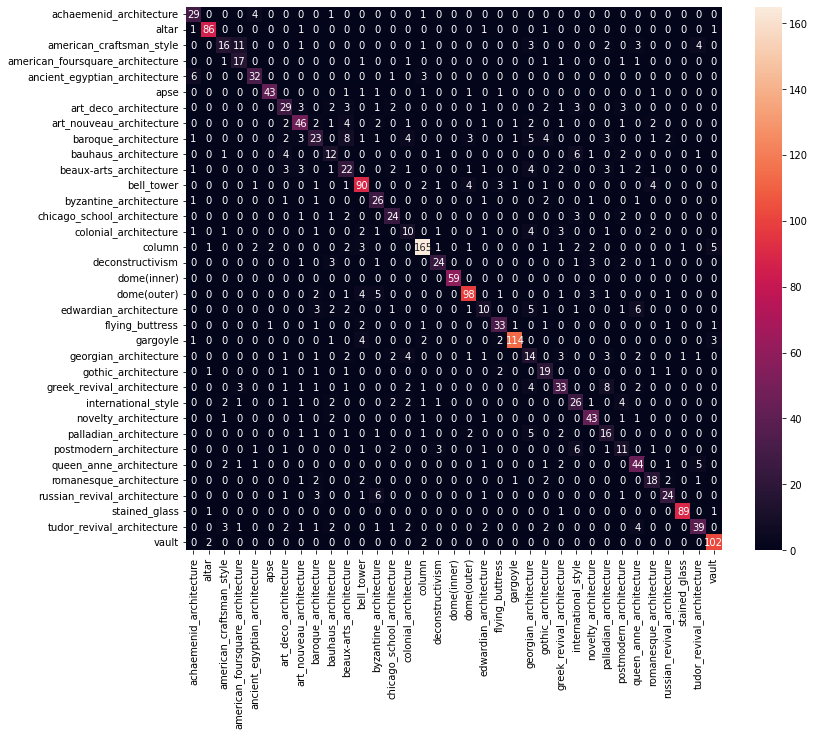

In [521]:
criterion = nn.CrossEntropyLoss()
test(model, criterion, x_test, y_test, lab2idx, print_report=True)

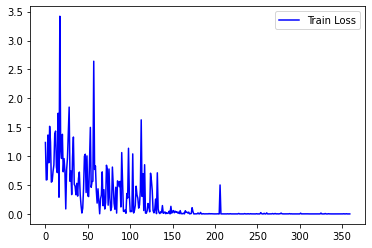

In [257]:
fig = plt.figure()
plt.plot(train_losses, color='blue')
plt.legend(['Train Loss'], loc='upper right')

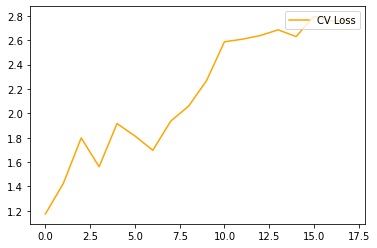

In [258]:
fig = plt.figure()
plt.plot(cv_losses, color='orange')

plt.legend(['CV Loss'], loc='upper right')

In [268]:
#https://medium.com/analytics-vidhya/deep-dream-visualizing-the-features-learnt-by-convolutional-networks-in-pytorch-b7296ae3b7f
#https://github.com/praritagarwal/Visualizing-CNN-Layers/blob/master/Activation%20Maximization.ipynb

In [16]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# undo the above normalization if and when the need arises 
denormalize = transforms.Normalize(mean = [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                   std = [1/0.229, 1/0.224, 1/0.225] )

In [299]:
# function to create an image with random pixels 
# the default will be to turn-off the requires_grad_ attribute of the image
def random_image(ht=28, wd=28, optimizer=None, lr=0.01):
    # we need the pixel values to be of type float32
    img = np.single(np.random.uniform(0,1, (3, ht, wd))) 
    
    # normalize the image to have requisite mean and std. dev.
    im_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True) 
    print("img_shape:{}, img_dtype: {}".format(im_tensor.shape, im_tensor.dtype ))
    
    if optimizer:
        return im_tensor, optimizer([im_tensor], lr=lr)
    
    return im_tensor


# function to massage img_tensor for using as input to plt.imshow()
def image_converter(im):
    # for plt.imshow() the channel-dimension is the last therefore use transpose to permute axes
    im_copy = denormalize(im.clone().detach()).numpy().transpose(1,2,0)
    
    # clip negative values as plt.imshow() only accepts floating values in range [0,1] and integers in range [0,255]
    im_copy = im_copy.clip(0, 1) 
    
    return im_copy

In [285]:
# class to compute image gradients in pytorch
class RGBgradients(nn.Module):
    def __init__(self, weight): # weight is a numpy array
        super().__init__()
        k_height, k_width = weight.shape[1:]
        
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 3 in_channels and 6 out_channels 
        # the 3 in_channels are the color channels of the image
        # for each in_channel we have 2 out_channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(3, 6, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        
        # initialize the weights of the convolutional layer to be the one provided
        # the weights correspond to the x/y filter for the channel in question and zeros for other channels
        weight1x = np.array([weight[0], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # x-derivative for 1st in_channel
        
        weight1y = np.array([weight[1], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # y-derivative for 1st in_channel
        
        weight2x = np.array([np.zeros((k_height, k_width)),
                             weight[0],
                             np.zeros((k_height, k_width))]) # x-derivative for 2nd in_channel
        
        weight2y = np.array([np.zeros((k_height, k_width)), 
                             weight[1],
                             np.zeros((k_height, k_width))]) # y-derivative for 2nd in_channel
        
        
        weight3x = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)),
                             weight[0]]) # x-derivative for 3rd in_channel
        
        weight3y = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)), 
                             weight[1]]) # y-derivative for 3rd in_channel
        
        weight_final = torch.from_numpy(np.array([weight1x, weight1y, 
                                                  weight2x, weight2y,
                                                  weight3x, weight3y])).type(torch.FloatTensor)
        
        if self.conv.weight.shape == weight_final.shape:
            self.conv.weight = nn.Parameter(weight_final)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
            
    
    def forward(self, x):
        return self.conv(x) 

In [527]:
class Test(nn.Module):
    def __init__(self):
        super().__init__()
        self.lin = nn.Linear(5,1)
    def forward(self,x):
        return self.lin(x)
    
t = Test()
t.eval()

for param in t.parameters():
    param.requires_grad_(False)
    
# We will register a forward hook to get the output of the layers
t_activation = {} # to store the activation  of a layer

def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        t_activation[name] = o
    return hook

t.lin.register_forward_hook(create_hook('test'))
t_activation = {}

x = torch.tensor([[1,2,3,4,5]], dtype=torch.float32).requires_grad_(True)
optimizer = optim.Adam([x], lr=0.1) 

optimizer.zero_grad()
t(x)

rms = torch.pow((t_activation['test'][0]**2).mean(), 0.5)
loss = -rms

loss.backward()
x.grad *= 10

optimizer.step()
x

In [597]:
def maximize_activation_simple(model, activation, layer_name, unit_idx=0,
                               optim_steps=40, optim_lr=0.4, model_name='inception'):
    # the neuron to visualize
    model.eval()
    
    img_tensor = random_image(256, 256)
    
    optimizer = optim.Adam([img_tensor], lr=optim_lr)

    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()

        #when model runs, the hooked layer is hit, which populates the activation dict with results
        model(img_tensor.unsqueeze(0))

        #the activation output of the hooked layer that we want to maximize
        layer_out = activation[layer_name]

        if unit_idx < 0:
            rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
        else:
            rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        # terminate if rms is nan
        if torch.isnan(rms):
            print('Error: rms was Nan; Terminating ...')
            sys.exit()

        loss = -act_wt*rms

        loss.backward()

        optimizer.step()

    img = image_converter(img_tensor)
    plt.imshow(img)
    plt.savefig('%s_%s_%d.png' % (model_name, layer_name, unit_idx), bbox_inches='tight')
    plt.show()

img_shape:torch.Size([3, 256, 256]), img_dtype: torch.float32


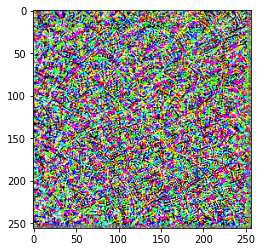

In [599]:
layer_name = 'Mixed_7a.branch3x3_1'
model.Mixed_7a.branch3x3_1.conv.register_forward_hook(create_hook(layer_name))
unit_idx = 5
activation = {}

maximize_activation_simple(model, activation, layer_name, unit_idx,
                           optim_steps=100, optim_lr=0.4, model_name='inception_simple')

In [591]:
def maximize_activation_with_scaling(model, gradLayer, activation, layer_name, unit_idx=0,
                        upscaling_steps=20, upscaling_factor=1.05, optim_steps=40, optim_lr=0.4, act_wt=0.5,
                        model_name='inception', penalize_intensity=True, penalize_sharp_gradients=True, 
                        blur_grad=False):
    # the neuron to visualize
    model.eval()
    
    img_tensor = random_image(80, 80)
    
    for mag_epoch in range(upscaling_steps+1):
        optimizer = optim.Adam([img_tensor], lr=optim_lr)

        for opt_epoch in range(optim_steps):
            optimizer.zero_grad()
            
            #when model runs, the hooked layer is hit, which populates the activation dict with results
            model(img_tensor.unsqueeze(0))
            
            #the activation output of the hooked layer that we want to maximize
            layer_out = activation[layer_name]

            if unit_idx < 0:
                rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
            else:
                rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                sys.exit()
                
            loss = -act_wt*rms

            # pixel intensity
            if penalize_intensity:
                pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
                # terminate if pxl_inty is nan
                if torch.isnan(pxl_inty):
                    print('Error: Pixel Intensity was Nan; Terminating ...')
                    sys.exit()
                
                loss += pxl_inty

            # image gradients-compute gradient loss of an image using the above defined gradLayer
            if penalize_sharp_gradients:
                gradSq = gradLayer(img_tensor.unsqueeze(0))**2
                im_grd = torch.pow(gradSq.mean(), 0.5)
                # terminate is im_grd is nan
                if torch.isnan(im_grd):
                    print('Error: image gradients were Nan; Terminating ...')
                    sys.exit()
                    
                loss += im_grd
    
            # print activation at the beginning of each mag_epoch
            if opt_epoch == 0 and mag_epoch%5==0:
                print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
            loss.backward()
            
            #experiment
            if blur_grad:
                #print('img tensor grad shape', img_tensor.grad.size())
                #g = img_tensor.grad
                #g_img = image_converter(g)
                #g_img = cv2.blur(g_img, (3,3))
                #g = normalize(torch.from_numpy(g_img.transpose(2,0,1))).to(device)
                #img_tensor.grad = g
                img_tensor.grad *= 0
            
            optimizer.step()

        img = image_converter(img_tensor)

        # scale up and move the color axis to be the first
        img = cv2.resize(img, dsize = (0,0), 
                         fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) 
        img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

    img = image_converter(img_tensor)
    plt.imshow(img)
    plt.savefig('%s_%s_%d.png' % (model_name, layer_name, unit_idx), bbox_inches='tight')
    plt.show()

In [270]:
for n,p in model.named_parameters():
    if '.conv.' in n:
        print(p.size(), n)

torch.Size([32, 3, 3, 3]) Conv2d_1a_3x3.conv.weight
torch.Size([32, 32, 3, 3]) Conv2d_2a_3x3.conv.weight
torch.Size([64, 32, 3, 3]) Conv2d_2b_3x3.conv.weight
torch.Size([80, 64, 1, 1]) Conv2d_3b_1x1.conv.weight
torch.Size([192, 80, 3, 3]) Conv2d_4a_3x3.conv.weight
torch.Size([64, 192, 1, 1]) Mixed_5b.branch1x1.conv.weight
torch.Size([48, 192, 1, 1]) Mixed_5b.branch5x5_1.conv.weight
torch.Size([64, 48, 5, 5]) Mixed_5b.branch5x5_2.conv.weight
torch.Size([64, 192, 1, 1]) Mixed_5b.branch3x3dbl_1.conv.weight
torch.Size([96, 64, 3, 3]) Mixed_5b.branch3x3dbl_2.conv.weight
torch.Size([96, 96, 3, 3]) Mixed_5b.branch3x3dbl_3.conv.weight
torch.Size([32, 192, 1, 1]) Mixed_5b.branch_pool.conv.weight
torch.Size([64, 256, 1, 1]) Mixed_5c.branch1x1.conv.weight
torch.Size([48, 256, 1, 1]) Mixed_5c.branch5x5_1.conv.weight
torch.Size([64, 48, 5, 5]) Mixed_5c.branch5x5_2.conv.weight
torch.Size([64, 256, 1, 1]) Mixed_5c.branch3x3dbl_1.conv.weight
torch.Size([96, 64, 3, 3]) Mixed_5c.branch3x3dbl_2.conv.weig

In [296]:
# Scharr Filters
# for e.g. see https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html#formulation
filter_x = np.array([[-3, 0, 3], 
                     [-10, 0, 10],
                     [-3, 0, 3]])

filter_y = filter_x.T
grad_filters = np.array([filter_x, filter_y])

# create an instance of the class 'gradients' with the given filters
gradLayer = RGBgradients(grad_filters)

In [577]:
#freeze model params
for param in model.parameters():
    param.requires_grad_(False)
    
# We will register a forward hook to get the output of the layers
activation = {} # to store the activation  of a layer

def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        activation[name] = o
    return hook

Generating image for unit 4
img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
begin mag_epoch 0, activation: 0.872717022895813
begin mag_epoch 5, activation: 3.1752541065216064
begin mag_epoch 10, activation: 4.283297061920166
begin mag_epoch 15, activation: 4.764832496643066
begin mag_epoch 20, activation: 3.839496612548828


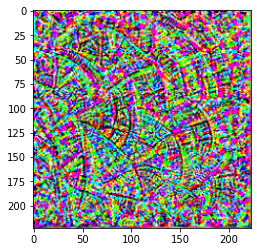

In [586]:
layer_name = 'Mixed_7a.branch3x3_1'
model.Mixed_7a.branch3x3_1.conv.register_forward_hook(create_hook(layer_name))

print('Generating image for unit %d' % i)
unit_idx = 5
activation = {}

maximize_activation_with_scaling(model, gradLayer, activation, layer_name, unit_idx,
                    upscaling_steps=20, upscaling_factor=1.05, optim_steps=20, optim_lr=0.5, act_wt=0.75,
                    model_name='inception_arch_nointensity_nosharpgrads',
                    penalize_intensity=False, 
                    penalize_sharp_gradients=False)

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
begin mag_epoch 0, activation: 0.8854018449783325
begin mag_epoch 5, activation: 3.6878879070281982
begin mag_epoch 10, activation: 4.641117095947266
begin mag_epoch 15, activation: 3.8003664016723633
begin mag_epoch 20, activation: 3.5282974243164062


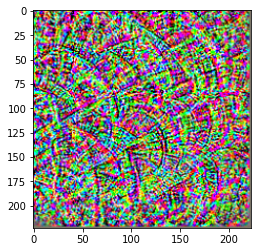

In [593]:
activation = {}

maximize_activation_with_scaling(model, gradLayer, activation, layer_name, unit_idx,
                    upscaling_steps=20, upscaling_factor=1.05, optim_steps=20, optim_lr=0.5, act_wt=0.75,
                    model_name='inception_arch_nosharpgrads',
                    penalize_intensity=True, 
                    penalize_sharp_gradients=False)

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
begin mag_epoch 0, activation: 0.9021150469779968
begin mag_epoch 5, activation: 3.2708473205566406
begin mag_epoch 10, activation: 4.259609222412109
begin mag_epoch 15, activation: 4.416553974151611
begin mag_epoch 20, activation: 4.04854679107666


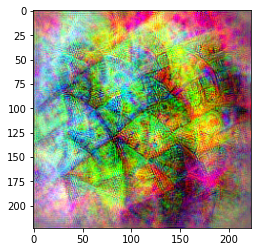

In [592]:
activation = {}

maximize_activation_with_scaling(model, gradLayer, activation, layer_name, unit_idx,
                    upscaling_steps=20, upscaling_factor=1.05, optim_steps=20, optim_lr=0.5, act_wt=0.75,
                    model_name='inception_arch_nointensity',
                    penalize_intensity=False, 
                    penalize_sharp_gradients=True)

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
begin mag_epoch 0, activation: 0.9000504612922668
begin mag_epoch 5, activation: 3.471482038497925
begin mag_epoch 10, activation: 4.4772138595581055
begin mag_epoch 15, activation: 4.3092041015625
begin mag_epoch 20, activation: 4.102705478668213


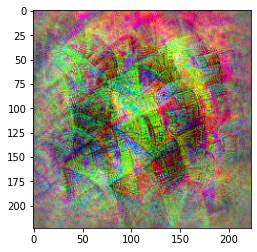

In [594]:
# register a forward hook for layer
layer_name = 'Mixed_7a.branch3x3_1'
model.Mixed_7a.branch3x3_1.conv.register_forward_hook(create_hook(layer_name))
unit_idx = 5
activation = {}

maximize_activation_with_scaling(model, gradLayer, activation, layer_name, unit_idx,
                    upscaling_steps=20, upscaling_factor=1.05, optim_steps=20, optim_lr=0.5, act_wt=0.75,
                    model_name='inception_arch')

In [503]:
# octaves
def maximize_activation_octaves(model, gradLayer, activation, layer_name, unit_idx=-1, im_size=(256,256), 
                                 num_octaves=4, octave_scale=1.4, optim_steps=20, optim_lr=0.4, act_wt=0.75,
                               model_name='inception'):
    # the neuron to visualize
    model.eval()
    
    img_tensor = random_image(im_size[0], im_size[1])
    img = image_converter(img_tensor)
    print('original im size ', img.shape)
    
    #img is shrunk
    img, octaves = get_octaves(img, num_octaves, octave_scale)
    img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
    print('img size after octaves: ', img_tensor.size())
    print('octaves', [o.shape for o in octaves])   
    
    # generate details octave by octave
    for i in range(octave_n):
        print('octave %d, im size %s' % (i, str(img_tensor.size())))
        if i>0:
            hi = octaves[-i] #smallest first
            
            #grow the image, add hi back in
            img = image_converter(img_tensor)
            print('resizing image ', img.shape)
            img = cv2.resize(img, dsize=(hi.shape[:2])) + hi #*0.5
            img = cv2.blur(img, (5,5))
            print('to ', img.shape)
            img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
        
        optimizer = optim.Adam([img_tensor], lr=1.0-(i*0.2)) #optim_lr)
        #print('lr', (0.5-(i*0.1)))
        
        #get grad for current size image
        for opt_epoch in range(optim_steps - (i*25)):
            optimizer.zero_grad()
            
            #when model runs, the hooked layer is hit, which populates the activation dict with results
            model(img_tensor.unsqueeze(0))
            
            #the activation output of the hooked layer that we want to maximize
            layer_out = activation[layer_name]
            
            if unit_idx < 0:
                rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
            else:
                rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                sys.exit()

            # pixel intensity
            pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
            # terminate if pxl_inty is nan
            if torch.isnan(pxl_inty):
                print('Error: Pixel Intensity was Nan; Terminating ...')
                sys.exit()

            # image gradients-compute gradient loss of an image using the above defined gradLayer
            gradSq = gradLayer(img_tensor.unsqueeze(0))**2
            im_grd = torch.pow(gradSq.mean(), 0.5)
            # terminate is im_grd is nan
            if torch.isnan(im_grd):
                print('Error: image gradients were Nan; Terminating ...')
                sys.exit()

            loss = -act_wt*rms + pxl_inty + im_grd        
            # print activation at the beginning of each mag_epoch
            if opt_epoch % 5 == 0:
                print('begin opt_epoch {}, activation: {}'.format(opt_epoch, rms))
            loss.backward()
            optimizer.step()
        
        img = image_converter(img_tensor)
        plt.imshow(img)
        plt.savefig('%s_%s_%d.png' % (model_name, layer_name, unit_idx), bbox_inches='tight')
        plt.show()


def get_octaves(img, num_octaves=4, octave_scale=1.4):
    octaves = []
    for i in range(num_octaves-1):
        h,w,c = img.shape

        #shrink
        lo = cv2.resize(img, dsize=(0,0), fx=1/octave_scale, fy=1/octave_scale)#.transpose(2,0,1)
        print(lo.shape)

        #expand and remove expanded version from original version
        hi = img - cv2.resize(lo, dsize=(w,h))

        #store difference
        octaves.append(hi)

        #set img to shrunk one
        img = lo
        
    return img, octaves

img_shape:torch.Size([3, 256, 256]), img_dtype: torch.float32
original im size  (256, 256, 3)
(183, 183, 3)
(131, 131, 3)
(94, 94, 3)
img size after octaves:  torch.Size([3, 94, 94])
octaves [(256, 256, 3), (183, 183, 3), (131, 131, 3)]
octave 0, im size torch.Size([3, 94, 94])
begin opt_epoch 0, activation: 0.764010488986969
begin opt_epoch 5, activation: 3.5819592475891113
begin opt_epoch 10, activation: 5.961024284362793
begin opt_epoch 15, activation: 7.745781421661377
begin opt_epoch 20, activation: 9.034151077270508
begin opt_epoch 25, activation: 8.568732261657715
begin opt_epoch 30, activation: 11.397008895874023
begin opt_epoch 35, activation: 11.878167152404785
begin opt_epoch 40, activation: 12.707189559936523
begin opt_epoch 45, activation: 13.087016105651855
begin opt_epoch 50, activation: 12.6641263961792
begin opt_epoch 55, activation: 13.725529670715332
begin opt_epoch 60, activation: 13.568696022033691
begin opt_epoch 65, activation: 14.048288345336914
begin opt_epoch 

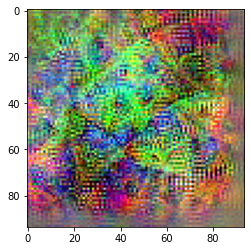

octave 1, im size torch.Size([3, 94, 94])
resizing image  (94, 94, 3)
to  (131, 131, 3)
begin opt_epoch 0, activation: 0.7305594682693481
begin opt_epoch 5, activation: 3.012974500656128
begin opt_epoch 10, activation: 4.942844390869141
begin opt_epoch 15, activation: 6.626569747924805
begin opt_epoch 20, activation: 8.798434257507324
begin opt_epoch 25, activation: 10.906022071838379
begin opt_epoch 30, activation: 12.35933780670166
begin opt_epoch 35, activation: 12.148378372192383
begin opt_epoch 40, activation: 13.272581100463867
begin opt_epoch 45, activation: 14.287735939025879
begin opt_epoch 50, activation: 14.518515586853027
begin opt_epoch 55, activation: 15.406596183776855
begin opt_epoch 60, activation: 15.467995643615723
begin opt_epoch 65, activation: 16.015830993652344
begin opt_epoch 70, activation: 16.335187911987305
begin opt_epoch 75, activation: 16.41064453125
begin opt_epoch 80, activation: 16.54213523864746
begin opt_epoch 85, activation: 17.199373245239258
begin 

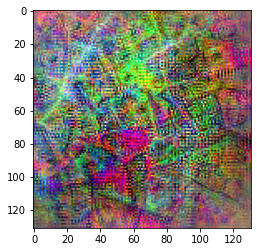

octave 2, im size torch.Size([3, 131, 131])
resizing image  (131, 131, 3)
to  (183, 183, 3)
begin opt_epoch 0, activation: 0.8065557479858398
begin opt_epoch 5, activation: 6.05766487121582
begin opt_epoch 10, activation: 11.247471809387207
begin opt_epoch 15, activation: 14.45235538482666
begin opt_epoch 20, activation: 16.708696365356445
begin opt_epoch 25, activation: 17.98114776611328
begin opt_epoch 30, activation: 19.039630889892578
begin opt_epoch 35, activation: 20.704364776611328
begin opt_epoch 40, activation: 21.96969985961914
begin opt_epoch 45, activation: 22.478050231933594
begin opt_epoch 50, activation: 23.26538848876953
begin opt_epoch 55, activation: 23.854045867919922
begin opt_epoch 60, activation: 24.817277908325195
begin opt_epoch 65, activation: 24.84357452392578
begin opt_epoch 70, activation: 25.714136123657227
begin opt_epoch 75, activation: 26.19960594177246
begin opt_epoch 80, activation: 27.089174270629883
begin opt_epoch 85, activation: 26.633527755737305


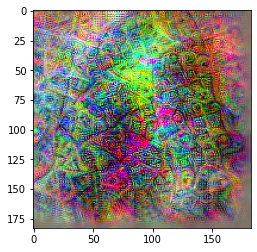

octave 3, im size torch.Size([3, 183, 183])
resizing image  (183, 183, 3)
to  (256, 256, 3)
begin opt_epoch 0, activation: 0.7099465131759644
begin opt_epoch 5, activation: 7.4209089279174805
begin opt_epoch 10, activation: 14.792201042175293
begin opt_epoch 15, activation: 20.90060806274414
begin opt_epoch 20, activation: 24.80480194091797
begin opt_epoch 25, activation: 27.495349884033203
begin opt_epoch 30, activation: 29.44728660583496
begin opt_epoch 35, activation: 30.92292594909668
begin opt_epoch 40, activation: 32.034454345703125
begin opt_epoch 45, activation: 32.95023727416992
begin opt_epoch 50, activation: 34.024532318115234
begin opt_epoch 55, activation: 35.4069938659668
begin opt_epoch 60, activation: 36.30556106567383


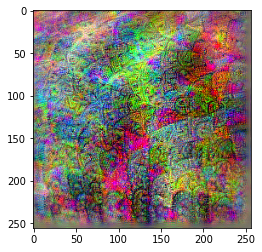

In [504]:
# register a forward hook for layer
#layer_name = 'Mixed_7a.branch3x3_1'
#layer_name = 'Mixed_7b.branch1x1'
#layer_name = 'Mixed_7b.branch_pool'
layer_name = 'Mixed_7a.branch3x3_1'
unit_idx = 5
model.Mixed_7a.branch3x3_1.conv.register_forward_hook(create_hook(layer_name))
activation = {}

maximize_activation_octaves(model, gradLayer, activation, layer_name, unit_idx,
        im_size=(256,256), num_octaves=4, octave_scale=1.4, optim_steps=140, optim_lr=0.4, act_wt=0.75,
                           model_name='inception_arch_octaves')

In [ ]:
#
# compare with orig model
#

In [495]:
orig_model = models.quantization.inception_v3(pretrained=True, aux_logits=False)

#freeze model params
for param in orig_model.parameters():
    param.requires_grad_(False)

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
begin mag_epoch 0, activation: 0.7908785939216614
begin mag_epoch 5, activation: 3.5250020027160645
begin mag_epoch 10, activation: 2.7994701862335205
begin mag_epoch 15, activation: 3.2114663124084473
begin mag_epoch 20, activation: 2.5487115383148193


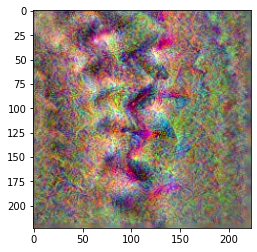

In [505]:
# register a forward hook for layer
layer_name = 'Mixed_7a.branch3x3_1'
unit_idx = 5
orig_model.Mixed_7a.branch3x3_1.conv.register_forward_hook(create_hook(layer_name))
activation = {}

maximize_activation(orig_model, gradLayer, activation, layer_name, unit_idx,
                    upscaling_steps=20, upscaling_factor=1.05, optim_steps=40, optim_lr=0.4, act_wt=0.75,
                   model_name='inception_orig')

img_shape:torch.Size([3, 256, 256]), img_dtype: torch.float32
original im size  (256, 256, 3)
(183, 183, 3)
(131, 131, 3)
(94, 94, 3)
img size after octaves:  torch.Size([3, 94, 94])
octaves [(256, 256, 3), (183, 183, 3), (131, 131, 3)]
octave 0, im size torch.Size([3, 94, 94])
begin opt_epoch 0, activation: 0.3003751337528229
begin opt_epoch 5, activation: 1.4195244312286377
begin opt_epoch 10, activation: 1.9363787174224854
begin opt_epoch 15, activation: 3.3089449405670166
begin opt_epoch 20, activation: 4.266394138336182
begin opt_epoch 25, activation: 4.59769344329834
begin opt_epoch 30, activation: 4.803066730499268
begin opt_epoch 35, activation: 4.325350761413574
begin opt_epoch 40, activation: 5.342774391174316
begin opt_epoch 45, activation: 4.8154520988464355
begin opt_epoch 50, activation: 5.5700483322143555
begin opt_epoch 55, activation: 5.3934431076049805
begin opt_epoch 60, activation: 4.927116870880127
begin opt_epoch 65, activation: 5.366711616516113
begin opt_epoch 7

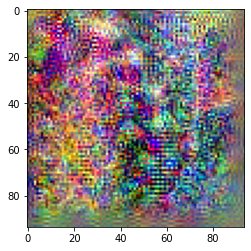

octave 1, im size torch.Size([3, 94, 94])
resizing image  (94, 94, 3)
to  (131, 131, 3)
begin opt_epoch 0, activation: 0.41537418961524963
begin opt_epoch 5, activation: 2.6575934886932373
begin opt_epoch 10, activation: 3.6632721424102783
begin opt_epoch 15, activation: 3.580810785293579
begin opt_epoch 20, activation: 4.205227851867676
begin opt_epoch 25, activation: 4.54083776473999
begin opt_epoch 30, activation: 5.143801689147949
begin opt_epoch 35, activation: 4.734385013580322
begin opt_epoch 40, activation: 5.348783493041992
begin opt_epoch 45, activation: 5.479386806488037
begin opt_epoch 50, activation: 4.891064643859863
begin opt_epoch 55, activation: 5.68806791305542
begin opt_epoch 60, activation: 5.100109100341797
begin opt_epoch 65, activation: 4.74788761138916
begin opt_epoch 70, activation: 5.652220249176025
begin opt_epoch 75, activation: 6.159679412841797
begin opt_epoch 80, activation: 5.687933444976807
begin opt_epoch 85, activation: 5.725436687469482
begin opt_epo

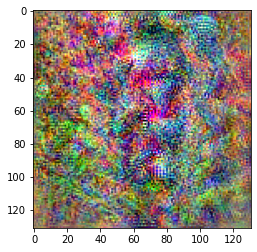

octave 2, im size torch.Size([3, 131, 131])
resizing image  (131, 131, 3)
to  (183, 183, 3)
begin opt_epoch 0, activation: 0.6990700960159302
begin opt_epoch 5, activation: 2.6204910278320312
begin opt_epoch 10, activation: 3.773651123046875
begin opt_epoch 15, activation: 4.107897758483887
begin opt_epoch 20, activation: 4.362052917480469
begin opt_epoch 25, activation: 4.6448140144348145
begin opt_epoch 30, activation: 4.927345275878906
begin opt_epoch 35, activation: 5.167133808135986
begin opt_epoch 40, activation: 5.339812278747559
begin opt_epoch 45, activation: 5.049971103668213
begin opt_epoch 50, activation: 5.732789993286133
begin opt_epoch 55, activation: 5.245692253112793
begin opt_epoch 60, activation: 5.42118501663208
begin opt_epoch 65, activation: 5.498862266540527
begin opt_epoch 70, activation: 5.670809745788574
begin opt_epoch 75, activation: 6.062775611877441
begin opt_epoch 80, activation: 5.854389190673828
begin opt_epoch 85, activation: 5.913540363311768


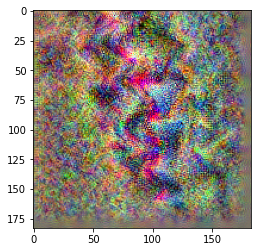

octave 3, im size torch.Size([3, 183, 183])
resizing image  (183, 183, 3)
to  (256, 256, 3)
begin opt_epoch 0, activation: 1.108951210975647
begin opt_epoch 5, activation: 2.0251729488372803
begin opt_epoch 10, activation: 3.077533006668091
begin opt_epoch 15, activation: 3.9164788722991943
begin opt_epoch 20, activation: 4.308304309844971
begin opt_epoch 25, activation: 4.311532497406006
begin opt_epoch 30, activation: 4.80979061126709
begin opt_epoch 35, activation: 4.693248748779297
begin opt_epoch 40, activation: 5.166923999786377
begin opt_epoch 45, activation: 3.812164783477783
begin opt_epoch 50, activation: 4.553879261016846
begin opt_epoch 55, activation: 5.552428722381592
begin opt_epoch 60, activation: 5.491833209991455


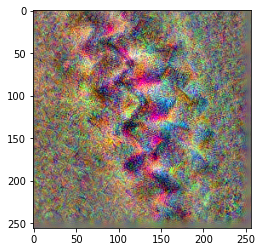

In [507]:
activation = {}

maximize_activation_octaves(orig_model, gradLayer, activation, layer_name, unit_idx,
        im_size=(256,256), num_octaves=4, octave_scale=1.4, optim_steps=140, optim_lr=0.4, act_wt=0.75,
                           model_name='inception_orig_octaves')

In [ ]:
#
# laplacian pyramid
#

In [ ]:
# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpA.append(G)
    
lpA = [gpA[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpA[i])
    L = cv2.subtract(gpA[i-1],GE)
    lpA.append(L)
    
# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpA,lpB):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)
    
# now reconstruct
ls_ = LS[0]
for i in range(1,6):
    ls_ = cv.pyrUp(ls_)
    ls_ = cv.add(ls_, LS[i])
# image with direct connecting each half
real = np.hstack((A[:,:cols//2],B[:,cols//2:]))

In [ ]:
height = 10
img0 = img.copy()
gpA = [img0]
for i in range(height):
    img0 = cv2.pyrDown(img0)
    gpA.append(img0)

lbImage = [gpA[-1]]
for j in range(height-1, 0, -1):
    GE = cv2.pyrUp(gpA[j])
    L = gpA[j-1] - GE
    lbImage.append(L)

ls_ = lbImage[0]     
for j in range(1, height, 1):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, lbImage[j])

ls_ = cv2.cvtColor(ls_, cv2.COLOR_YCR_CB2BGR)                
cv2.imshow("Pyramid reconstructed Image",ls_)
cv2.waitKey(0)

In [418]:
k = np.float32([1,4,6,4,1])
k = np.outer(k, k)
#each entry in the 5x5=25 element k is multiplied by 3x3 I, yielding shape (5,5,3,3) for a filter
#[filter_height, filter_width, in_channels, out_channels] #one chan per color
k5x5 = k[:,:,None,None]/k.sum()*np.eye(3, dtype=np.float32)
k5x5 = torch.from_numpy(k5x5)

array([[[[0.00390625, 0.        , 0.        ],
         [0.        , 0.00390625, 0.        ],
         [0.        , 0.        , 0.00390625]],

        [[0.015625  , 0.        , 0.        ],
         [0.        , 0.015625  , 0.        ],
         [0.        , 0.        , 0.015625  ]],

        [[0.0234375 , 0.        , 0.        ],
         [0.        , 0.0234375 , 0.        ],
         [0.        , 0.        , 0.0234375 ]],

        [[0.015625  , 0.        , 0.        ],
         [0.        , 0.015625  , 0.        ],
         [0.        , 0.        , 0.015625  ]],

        [[0.00390625, 0.        , 0.        ],
         [0.        , 0.00390625, 0.        ],
         [0.        , 0.        , 0.00390625]]],


       [[[0.015625  , 0.        , 0.        ],
         [0.        , 0.015625  , 0.        ],
         [0.        , 0.        , 0.015625  ]],

        [[0.0625    , 0.        , 0.        ],
         [0.        , 0.0625    , 0.        ],
         [0.        , 0.        , 0.0625    ]]

In [447]:
#https://gist.github.com/alper111/b9c6d80e2dba1ee0bfac15eb7dad09c8
    
def gauss_kernel(size=5, device=torch.device('cpu'), channels=3):
    kernel = torch.tensor([[1., 4., 6., 4., 1],
                           [4., 16., 24., 16., 4.],
                           [6., 24., 36., 24., 6.],
                           [4., 16., 24., 16., 4.],
                           [1., 4., 6., 4., 1.]])
    kernel /= 256.
    kernel = kernel.repeat(channels, 1, 1, 1)
    kernel = kernel.to(device)
    return kernel

def downsample(x):
    return x[:, :, ::2, ::2]

def upsample(x):
    cc = torch.cat([x, torch.zeros(x.shape[0], x.shape[1], x.shape[2], x.shape[3], device=x.device)], dim=3)
    cc = cc.view(x.shape[0], x.shape[1], x.shape[2]*2, x.shape[3])
    cc = cc.permute(0,1,3,2)
    cc = torch.cat([cc, torch.zeros(x.shape[0], x.shape[1], x.shape[3], x.shape[2]*2, device=x.device)], dim=3)
    cc = cc.view(x.shape[0], x.shape[1], x.shape[3]*2, x.shape[2]*2)
    x_up = cc.permute(0,1,3,2)
    return conv_gauss(x_up, 4*gauss_kernel(channels=x.shape[1], device=x.device))

def conv_gauss(img, kernel):
    img = F.pad(img, (2, 2, 2, 2), mode='reflect')
    out = F.conv2d(img, kernel, groups=img.shape[1])
    return out

def laplacian_pyramid(img, kernel, max_levels=3):
    current = img
    pyr = []
    for level in range(max_levels):
        filtered = conv_gauss(current, kernel)
        down = downsample(filtered)
        up = upsample(down)
        diff = current-up
        pyr.append(diff)
        current = down
    return pyr

In [452]:
img = cv2.cvtColor(cv2.imread('%s/vault/280320176_465a668635_m.jpg' % arch_path), cv2.COLOR_BGR2RGB)
img = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0)
print(img.size())
scale_n = 4
levels = laplacian_pyramid(img.float(), gauss_kernel(), max_levels=scale_n)

torch.Size([1, 3, 128, 128])


In [455]:
levels[0].size(), levels[1].size(), levels[2].size(), levels[3].size()

(torch.Size([1, 3, 128, 128]),
 torch.Size([1, 3, 64, 64]),
 torch.Size([1, 3, 32, 32]),
 torch.Size([1, 3, 16, 16]))

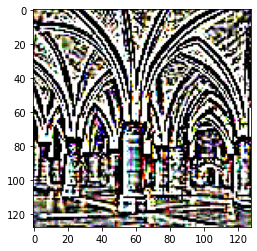

In [457]:
plt.imshow(image_converter(levels[0].squeeze()))

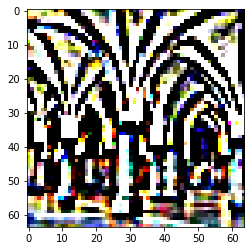

In [458]:
plt.imshow(image_converter(levels[1].squeeze()))

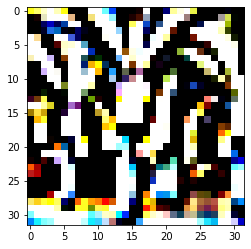

In [459]:
plt.imshow(image_converter(levels[2].squeeze()))

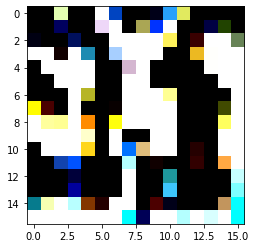

In [460]:
plt.imshow(image_converter(levels[3].squeeze()))

In [461]:
levels = levels[::-1]

In [462]:
for i,lvl in enumerate(levels):
    std = torch.sqrt(torch.mean(torch.square(lvl)))
    lvl /= torch.clip(std, min=1e-10)
    levels[i]=lvl

In [463]:
merged = torch.zeros_like(levels[0])
for p in levels:
    merged += p

RuntimeError: The size of tensor a (16) must match the size of tensor b (32) at non-singleton dimension 3

In [ ]:
class LaplacianPyramid(nn.Module):
    def __init__(self, input, scale=4, sigma=1):
        super(LaplacianPyramid, self).__init__()
        if len(sigma) == 1:
            sigma = (float(sigma[0]), float(sigma[0]) * scale)
        else:
            sigma = [float(s) for s in sigma]
        self.gauss_blur = GaussianBlurLP(input, 5, sigma[0])
        self.gauss_blur_hi = GaussianBlurLP(input, 5, sigma[1])
        self.scale = scale

    def split_lap(self, input):
        g = self.gauss_blur(input)
        gt = self.gauss_blur_hi(input)
        return g, input - gt

    def pyramid_list(self, input):
        pyramid_levels = []
        for i in range(self.scale):
            input, hi = self.split_lap(input)
            pyramid_levels.append(hi)
        pyramid_levels.append(input)
        return pyramid_levels[::-1]

    def lap_merge(self, pyramid_levels):
        b = torch.zeros_like(pyramid_levels[0])
        for p in pyramid_levels:
            b = b + p
        return b

    def forward(self, input):
        return self.lap_merge(self.pyramid_list(input))

In [ ]:
def lap_normalize(img, k5x5, scale_n=4):
    '''Perform the Laplacian pyramid normalization.'''
    img = img.unsqueeze(0)
    
    levels = []
    for i in range(scale_n):
        #lo, hi
        
        lo = nn.conv2d(img, k5x5, (1,2,2,1), 'SAME')
        #deconvolution - transpose of the gradient (value, filter, output_shape, strides)
        lo2 = nn.conv2d_transpose(lo, k5x5*4, tf.shape(img), [1,2,2,1])
        hi = img-lo2
        
        
        levels.append(hi)
    levels.append(img)
    return levels[::-1]
    
    tlevels = lap_split_n(img, scale_n)
    tlevels = list(map(normalize_std, tlevels))
    out = lap_merge(tlevels)
    return out[0,:,:,:]

In [387]:
def maximize_activation_pyramid(model, gradLayer, activation, layer_name, unit_idx=-1, im_size=(256,256), 
                                 num_octaves=4, octave_scale=1.4, optim_steps=20, optim_lr=0.4, act_wt=0.75):
    # the neuron to visualize
    model.eval()
    
    img_tensor = random_image(im_size[0], im_size[1])
    img = image_converter(img_tensor)
    print('original im size ', img.shape)
    
    #img is shrunk
    img, octaves = get_octaves(img, num_octaves, octave_scale)
    img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
    print('img size after octaves: ', img_tensor.size())
    print('octaves', [o.shape for o in octaves])   
    
    # generate details octave by octave
    for i in range(octave_n):
        print('octave %d, im size %s' % (i, str(img_tensor.size())))
        if i>0:
            hi = octaves[-i] #smallest first
            
            #grow the image, add hi back in
            img = image_converter(img_tensor)
            print('resizing image ', img.shape)
            img = cv2.resize(img, dsize=(hi.shape[:2])) + hi
            print('to ', img.shape)
            img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
        
        optimizer = optim.Adam([img_tensor], lr=optim_lr)
        
        #get grad for current size image
        for opt_epoch in range(optim_steps):
            optimizer.zero_grad()
            
            #when model runs, the hooked layer is hit, which populates the activation dict with results
            model(img_tensor.unsqueeze(0))
            
            #the activation output of the hooked layer that we want to maximize
            layer_out = activation[layer_name]
            
            if unit_idx < 0:
                rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
            else:
                rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                sys.exit()

            # pixel intensity
            pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
            # terminate if pxl_inty is nan
            if torch.isnan(pxl_inty):
                print('Error: Pixel Intensity was Nan; Terminating ...')
                sys.exit()

            # image gradients-compute gradient loss of an image using the above defined gradLayer
            gradSq = gradLayer(img_tensor.unsqueeze(0))**2
            im_grd = torch.pow(gradSq.mean(), 0.5)
            # terminate is im_grd is nan
            if torch.isnan(im_grd):
                print('Error: image gradients were Nan; Terminating ...')
                sys.exit()

            loss = -act_wt*rms + pxl_inty + im_grd        
            # print activation at the beginning of each mag_epoch
            if opt_epoch % 5 == 0:
                print('begin opt_epoch {}, activation: {}'.format(opt_epoch, rms))
            loss.backward()
            optimizer.step()
        
        img = image_converter(img_tensor)
        plt.imshow(img)


def get_octaves(img, num_octaves=4, octave_scale=1.4):
    octaves = []
    for i in range(num_octaves-1):
        h,w,c = img.shape

        #shrink
        lo = cv2.resize(img, dsize=(0,0), fx=1/octave_scale, fy=1/octave_scale)#.transpose(2,0,1)
        print(lo.shape)

        #expand and remove expanded version from original version
        hi = img - cv2.resize(lo, dsize=(w,h))

        #store difference
        octaves.append(hi)

        #set img to shrunk one
        img = lo
        
    return img, octaves




In [ ]:
def maximize_activation_tiled(model, gradLayer, activation, layer_name, unit_idx=-1, im_size=(256,256), 
                                 num_octaves=4, octave_scale=1.4, optim_steps=20, optim_lr=0.4, act_wt=0.75):
    # the neuron to visualize
    model.eval()
    
    img_tensor = random_image(im_size[0], im_size[1])
    img = image_converter(img_tensor)
    print('original im size ', img.shape)
    
    #img is shrunk
    img, octaves = get_octaves(img, num_octaves, octave_scale)
    img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
    print('img size after octaves: ', img_tensor.size())
    print('octaves', [o.shape for o in octaves])   
    
    # generate details octave by octave
    for i in range(octave_n):
        print('octave %d, im size %s' % (i, str(img_tensor.size())))
        if i>0:
            hi = octaves[-i] #smallest first
            
            #grow the image, add hi back in
            img = image_converter(img_tensor)
            print('resizing image ', img.shape)
            img = cv2.resize(img, dsize=(hi.shape[:2])) + hi
            print('to ', img.shape)
            img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
        
        optimizer = optim.Adam([img_tensor], lr=optim_lr)
        
        #get grad for current size image
        for opt_epoch in range(optim_steps):
            optimizer.zero_grad()
            
            #when model runs, the hooked layer is hit, which populates the activation dict with results
            model(img_tensor.unsqueeze(0))
            
            #the activation output of the hooked layer that we want to maximize
            layer_out = activation[layer_name]
            
            if unit_idx < 0:
                rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
            else:
                rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                sys.exit()

            # pixel intensity
            pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
            # terminate if pxl_inty is nan
            if torch.isnan(pxl_inty):
                print('Error: Pixel Intensity was Nan; Terminating ...')
                sys.exit()

            # image gradients-compute gradient loss of an image using the above defined gradLayer
            gradSq = gradLayer(img_tensor.unsqueeze(0))**2
            im_grd = torch.pow(gradSq.mean(), 0.5)
            # terminate is im_grd is nan
            if torch.isnan(im_grd):
                print('Error: image gradients were Nan; Terminating ...')
                sys.exit()

            loss = -act_wt*rms + pxl_inty + im_grd        
            # print activation at the beginning of each mag_epoch
            if opt_epoch % 5 == 0:
                print('begin opt_epoch {}, activation: {}'.format(opt_epoch, rms))
            loss.backward()
            optimizer.step()
        
        img = image_converter(img_tensor)
        plt.imshow(img)


def get_octaves(img, num_octaves=4, octave_scale=1.4):
    octaves = []
    for i in range(num_octaves-1):
        h,w,c = img.shape

        #shrink
        lo = cv2.resize(img, dsize=(0,0), fx=1/octave_scale, fy=1/octave_scale)#.transpose(2,0,1)
        print(lo.shape)

        #expand and remove expanded version from original version
        hi = img - cv2.resize(lo, dsize=(w,h))

        #store difference
        octaves.append(hi)

        #set img to shrunk one
        img = lo
        
    return img, octaves


def get_tiled_activation(img_tensor, model, activation, layer_name, unit_idx, tile_size=512):
    tiled_activation=[]
    for y in range(0, max(h-tile_size//2, tile_size), tile_size):
        tiles_x=[]
        for x in range(0, max(w-tile_size//2, tile_size), tile_size):
            #get a tile from shifted image
            sub = img_tensor[:,y:y+tile_size, x:x+tile_size]
            model(sub.unsqueeze(0))
            layer_out = activation[layer_name][0, unit_idx]
            tiles_x.append(layer_out)
            
        tiles_x = torch.cat(tiles_x, 1)
        tiled_activation.append(tiles_x)
        
    tiled_activation = torch.cat(tiled_activation, 0)
    
    print(tiled_activation.size())
    
    return tiled_activation

In [388]:
img_tensor = random_image(512, 512)

octaves = get_octaves(img_tensor, num_octaves=4, octave_scale=1.4)

img_shape:torch.Size([3, 512, 512]), img_dtype: torch.float32
(366, 366, 3)
(261, 261, 3)
(186, 186, 3)
[(512, 512, 3), (366, 366, 3), (261, 261, 3)]


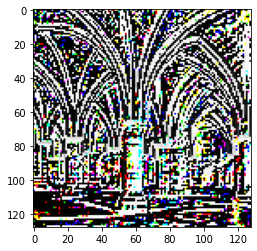

In [333]:
plt.imshow(octaves[0])

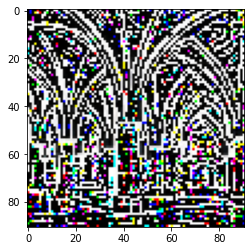

In [334]:
plt.imshow(octaves[1])

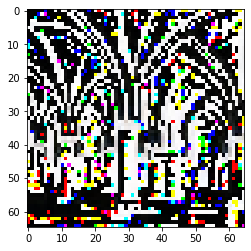

In [335]:
plt.imshow(octaves[2])

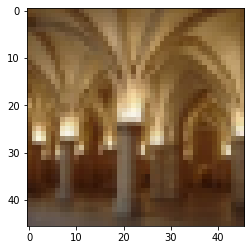

In [336]:
plt.imshow(img)

3 46


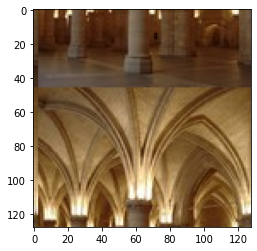

In [354]:
#def calc_grad_tiled(img, model, tile_size=512):
tile_size = 96
img = cv2.cvtColor(cv2.imread('%s/vault/280320176_465a668635_m.jpg' % arch_path), cv2.COLOR_BGR2RGB)

h, w = img.shape[:2]
sx, sy = np.random.randint(tile_size, size=2)
print(sx, sy)
#note that x is dim 1, and y is dim 0
img_shift = np.roll(np.roll(img, sx, 1), sy, 0)
    
plt.imshow(img_shift)

In [359]:
gl = gradLayer(img_tensor.unsqueeze(0))
gl.size()

torch.Size([1, 6, 96, 96])

In [368]:
img = cv2.cvtColor(cv2.imread('%s/vault/280320176_465a668635_m.jpg' % arch_path), cv2.COLOR_BGR2RGB)
img_tensor = normalize(torch.from_numpy(img.astype(np.float32).transpose(2,0,1))).to(device).requires_grad_(True)
img_tensor.size()

torch.Size([3, 128, 128])

In [371]:
img_tensor = random_image(2048, 2048)
model(img_tensor.unsqueeze(0))
layer_out = activation[layer_name][0, unit_idx]
layer_out.size()

img_shape:torch.Size([3, 2048, 2048]), img_dtype: torch.float32


torch.Size([126, 126])

In [ ]:
class LaplacianPyramid(nn.Module):
    def __init__(self, input, scale=4, sigma=1):
        super(LaplacianPyramid, self).__init__()
        if len(sigma) == 1:
            sigma = (float(sigma[0]), float(sigma[0]) * scale)
        else:
            sigma = [float(s) for s in sigma]
        self.gauss_blur = GaussianBlurLP(input, 5, sigma[0])
        self.gauss_blur_hi = GaussianBlurLP(input, 5, sigma[1])
        self.scale = scale

    def split_lap(self, input):
        g = self.gauss_blur(input)
        gt = self.gauss_blur_hi(input)
        return g, input - gt

    def pyramid_list(self, input):
        pyramid_levels = []
        for i in range(self.scale):
            input, hi = self.split_lap(input)
            pyramid_levels.append(hi)
        pyramid_levels.append(input)
        return pyramid_levels[::-1]

    def lap_merge(self, pyramid_levels):
        b = torch.zeros_like(pyramid_levels[0])
        for p in pyramid_levels:
            b = b + p
        return b

    def forward(self, input):
        return self.lap_merge(self.pyramid_list(input))
    
    
# Define an nn Module to apply jitter
class Jitter(torch.nn.Module):
    def __init__(self, jitter_val):
        super(Jitter, self).__init__()
        self.jitter_val = jitter_val

    def roll_tensor(self, input):
        h_shift = random.randint(-self.jitter_val, self.jitter_val)
        w_shift = random.randint(-self.jitter_val, self.jitter_val)
        return torch.roll(torch.roll(input, shifts=h_shift, dims=2), shifts=w_shift, dims=3)

    def forward(self, input):
        return self.roll_tensor(input)

In [382]:
h=w=2000
img_tensor = random_image(h, h)
tile_size=512
tiles=[]
for y in range(0, max(h-tile_size//2, tile_size), tile_size):
    tiles_x=[]
    for x in range(0, max(w-tile_size//2, tile_size), tile_size):
        #get a tile from shifted image
        sub = img_tensor[:,y:y+tile_size, x:x+tile_size]
        model(sub.unsqueeze(0))
        layer_out = activation[layer_name][0, unit_idx]
        tiles_x.append(layer_out)
        #print(y,x,layer_out.size())
    tiles_x = torch.cat(tiles_x, 1)
    #print(tiles_x.size())
    tiles.append(tiles_x)
tiles = torch.cat(tiles, 0)
tiles.size()

img_shape:torch.Size([3, 2000, 2000]), img_dtype: torch.float32


torch.Size([117, 117])

In [360]:
unit_idx = 0
tiled_layer_out = []
#h,w=128, t=64: 0 to 96 by 64, so 0,64
for y in range(0, max(h-tile_size//2, tile_size), tile_size):
    tiles_x = []
    for x in range(0, max(w-tile_size//2, tile_size), tile_size):
        #get a tile from shifted image
        sub = img_shift[y:y+tile_size, x:x+tile_size]
            
        img_tensor = normalize(torch.from_numpy(sub.astype(np.float32).transpose(2,0,1))).requires_grad_(True)
        model(img_tensor.unsqueeze(0))

        #the activation output of the hooked layer that we want to maximize
        layer_out = activation[layer_name][0, unit_idx]
        
        tiles_x.append(layer_out)
    tiled_layer_out.append(tiles_x)
#unshift
tiled_layer_out = np.roll(np.roll(tiled_layer_out.numpy(), -sx, 1), -sy, 0)
tiled_layer_out.shape

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

In [356]:
img_tensor = normalize(torch.from_numpy(sub.astype(np.float32).transpose(2,0,1))).requires_grad_(True)
img_tensor.size()

torch.Size([3, 96, 96])

In [362]:
#img_tensor = normalize(torch.from_numpy(sub.transpose(2,0,1))).to(device).requires_grad_(True)

model(img_tensor.unsqueeze(0))

#the activation output of the hooked layer that we want to maximize
layer_out = activation[layer_name]
layer_out.size()

torch.Size([1, 192, 4, 4])

In [364]:
layer_out[0,12].size()

torch.Size([4, 4])

In [ ]:
# generate details octave by octave
iter_n=10
step=1.0
for octave in range(octave_n):
    if octave>0:
        hi = octaves[-octave]
        img = cv2.resize(img, dsize=(hi.shape[:2])) + hi
    for i in range(iter_n):
        g = calc_grad_tiled(img, model)
        img += g*(step / (np.abs(g).mean()+1e-7))
        print('.',end = ' ')
    plt.imshow(img/255.0)

In [ ]:
#img_tensor = normalize(torch.from_numpy(img)).requires_grad_(True)

In [ ]:
lap_n=4

In [ ]:
# the neuron to visualize
model.eval()

img_tensor = random_image(80, 80)

for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr=optim_lr)

    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()

        #when model runs, the hooked layer is hit, which populates the activation dict with results
        model(img_tensor.unsqueeze(0))

        #the activation output of the hooked layer that we want to maximize
        layer_out = activation[layer_name]

        if unit_idx < 0:
            rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
        else:
            rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        # terminate if rms is nan
        if torch.isnan(rms):
            print('Error: rms was Nan; Terminating ...')
            sys.exit()

        # pixel intensity
        pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
        # terminate if pxl_inty is nan
        if torch.isnan(pxl_inty):
            print('Error: Pixel Intensity was Nan; Terminating ...')
            sys.exit()

        # image gradients-compute gradient loss of an image using the above defined gradLayer
        gradSq = gradLayer(img_tensor.unsqueeze(0))**2
        im_grd = torch.pow(gradSq.mean(), 0.5)
        # terminate is im_grd is nan
        if torch.isnan(im_grd):
            print('Error: image gradients were Nan; Terminating ...')
            sys.exit()

        loss = -act_wt*rms + pxl_inty + im_grd        
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0 and mag_epoch%5==0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
        loss.backward()
        optimizer.step()

    img = image_converter(img_tensor)

    # scale up and move the color axis to be the first
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) 
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

img = image_converter(img_tensor)
plt.imshow(img)
plt.savefig('test_%s_%d.png' % (layer_name, unit_idx), bbox_inches='tight')
plt.show()

In [ ]:
t_score = tf.reduce_mean(t_obj) # defining the optimization objective
    t_grad = tf.gradients(t_score, t_input)[0] # behold the power of automatic differentiation!

    # split the image into a number of octaves
    img = img0
    octaves = []
    for i in range(octave_n-1):
        hw = img.shape[:2]
        lo = resize(img, np.int32(np.float32(hw)/octave_scale))
        hi = img-resize(lo, hw)
        img = lo
        octaves.append(hi)
    
    # generate details octave by octave
    for octave in range(octave_n):
        if octave>0:
            hi = octaves[-octave]
            img = resize(img, hi.shape[:2])+hi
        for i in range(iter_n):
            g = calc_grad_tiled(img, t_grad)
            img += g*(step / (np.abs(g).mean()+1e-7))
            print('.',end = ' ')
        clear_output()
        showarray(img/255.0)




In [ ]:
def resize(img, size):
    #add a dimension at axis 0
    img = tf.expand_dims(img, 0)
    return tf.image.resize_bilinear(img, size)[0,:,:,:]

def visstd(a, s=0.1):
    '''Normalize the image range for visualization'''
    return (a-a.mean())/max(a.std(), 1e-4)*s + 0.5

def calc_grad_tiled(img, t_grad, tile_size=512):
    '''Compute the value of tensor t_grad over the image in a tiled way.
    Random shifts are applied to the image to blur tile boundaries over 
    multiple iterations.'''
    sz = tile_size
    h, w = img.shape[:2]
    sx, sy = np.random.randint(sz, size=2)
    #note that x is dim 1, and y is dim 0
    img_shift = np.roll(np.roll(img, sx, 1), sy, 0)
    grad = np.zeros_like(img)
    for y in range(0, max(h-sz//2, sz),sz):
        for x in range(0, max(w-sz//2, sz),sz):
            #get a tile from shifted image
            sub = img_shift[y:y+sz,x:x+sz]
            #evaluate gradient node of comp graph
            g = sess.run(t_grad, {t_input:sub})
            #set grad for this tile
            grad[y:y+sz,x:x+sz] = g
    #unshift img
    return np.roll(np.roll(grad, -sx, 1), -sy, 0)

In [ ]:
#the resulting images mostly contain high frequencies. Can we improve it?
# One way is to add a smoothness prior into the optimization objective. 
#This will effectively blur the image a little every iteration, suppressing the higher 
#frequencies, so that the lower frequencies can catch up. This will require more iterations 
#to produce a nice image.
# Why don't we just boost lower frequencies of the gradient instead? 
#One way to achieve this is through the Laplacian pyramid decomposition. We call the resulting 
#technique Laplacian Pyramid Gradient Normalization.

k = np.float32([1,4,6,4,1])
k = np.outer(k, k)
#each entry in the 5x5=25 element k is multiplied by 3x3 I, yielding shape (5,5,3,3) for a filter
#[filter_height, filter_width, in_channels, out_channels] #one chan per color
k5x5 = k[:,:,None,None]/k.sum()*np.eye(3, dtype=np.float32)

def lap_split(img):
    '''Split the image into lo and hi frequency components'''
    lo = nn.conv2d(img, k5x5, [1,2,2,1], 'SAME')
    #deconvolution - transpose of the gradient (value, filter, output_shape, strides)
    lo2 = nn.conv2d_transpose(lo, k5x5*4, img.size(), [1,2,2,1])
    hi = img-lo2
    return lo, hi

def lap_split_n(img, n):
    '''Build Laplacian pyramid with n splits'''
    levels = []
    for i in range(n):
        #lo, hi
        img, hi = lap_split(img) #img=lo
        levels.append(hi)
    levels.append(img)
    return levels[::-1] #reverse - lo, hi,hi,hi...

def lap_merge(levels):
    '''Merge Laplacian pyramid'''
    img = levels[0] #lo
    for hi in levels[1:]:
        img = nn.conv2d_transpose(img, k5x5*4, hi.size(), [1,2,2,1]) + hi
    return img

def normalize_std(img, eps=1e-10):
    '''Normalize image by making its standard deviation = 1.0'''
    std = np.sqrt(np.mean(np.square(img)))
    return img/np.max(std, eps)

def lap_normalize(img, scale_n=4):
    '''Perform the Laplacian pyramid normalization.'''
    img = img.unsqueeze(0)
    tlevels = lap_split_n(img, scale_n)
    tlevels = list(map(normalize_std, tlevels))
    out = lap_merge(tlevels)
    return out[0,:,:,:]

In [ ]:
def render_deepdream(t_obj, img0=img_noise,
                     iter_n=10, step=1.5, octave_n=4, octave_scale=1.4):
    t_score = tf.reduce_mean(t_obj) # defining the optimization objective
    t_grad = tf.gradients(t_score, t_input)[0] # behold the power of automatic differentiation!

    # split the image into a number of octaves
    img = img0
    octaves = []
    for i in range(octave_n-1):
        hw = img.shape[:2]
        lo = resize(img, np.int32(np.float32(hw)/octave_scale))
        hi = img-resize(lo, hw)
        img = lo
        octaves.append(hi)
    
    # generate details octave by octave
    for octave in range(octave_n):
        if octave>0:
            hi = octaves[-octave]
            img = resize(img, hi.shape[:2])+hi
        for i in range(iter_n):
            g = calc_grad_tiled(img, t_grad)
            img += g*(step / (np.abs(g).mean()+1e-7))
            print('.',end = ' ')
        clear_output()
        showarray(img/255.0)

In [ ]:
from moviepy.editor import ImageSequenceClip
from PIL import ImageEnhance, ImageOps

def render_lapnorm_animate(t_obj, img0=img_noise, visfunc=visstd, iter_n=10, 
                           step=1.0, octave_n=3, octave_scale=1.4, lap_n=4, 
                           num_frames=30, iter_per_frame=5, zoom_per_frame=1.01, 
                           name='animation', frame_dir='frames'):
    t_score = tf.reduce_mean(t_obj) # optimization objective
    t_grad = tf.gradients(t_score, t_input)[0] 
    lap_norm_func = tffunc(np.float32)(partial(lap_normalize, scale_n=lap_n))

    img = img0.copy()
    for octave in range(octave_n):
        #lap_norm_func = tffunc(np.float32)(partial(lap_normalize, scale_n=lap_n+octave))
        if octave>0:
            hw = np.float32(img.shape[:2])*octave_scale
            #dyn_scale = ((octave_scale - 1) * math.exp(-0.4 * octave)) + 1
            #print(dyn_scale)
            #hw = np.float32(img.shape[:2])*dyn_scale
            img = resize(img, np.int32(hw))
        #dyn_iters = math.floor(iter_n * math.exp(-0.3 * octave)) # - to decay
        #print(dyn_iters)
        for i in range(iter_n):#dyn_iters):
            g = calc_grad_tiled(img, t_grad)
            g = lap_norm_func(g)
            #gradient ascent to increase the objective function
            img += g*step
            print('.', end = ' ')
        clear_output()
        print('Base:')
        showarray(visfunc(img))
        
    hw_orig = np.float32(img.shape[:2])
    for i in range(num_frames):
        hw = np.float32(img.shape[:2])*zoom_per_frame
        img = resize(img, np.int32(hw))
        offset = ((hw[0]-hw_orig[0])//2, (hw[1]-hw_orig[1])//2)
        img = img[int(offset[0]):int(offset[0]+hw_orig[0]), int(offset[1]):int(offset[1]+hw_orig[1]), :]
        
        for j in range(iter_per_frame):
            g = calc_grad_tiled(img, t_grad)
            g = lap_norm_func(g)
            img += g*step
            print('.', end = ' ')
        clear_output()
        
        img_norm = norm(img.copy())

        print('Normed Frame %d:'%i)
        showarray(visfunc(img_norm))
        pil_im = PIL.Image.fromarray(img_norm.astype('uint8'))
        pil_im = ImageEnhance.Contrast(pil_im).enhance(1.25)
        pil_im.save(frame_dir+"/%04d_%s.jpg"%(i, name))
        
    anim_moviepy(name, frame_dir)
    
def norm(im_array):
    im_array_norm = (im_array-im_array.mean())/max(im_array.std(), 1e-4)*0.1 + 0.5
    im_array_norm = np.uint8(np.clip(im_array_norm, 0, 1)*255)
    return im_array_norm
    
def anim_moviepy(name, frame_dir):
    anim = ImageSequenceClip(frame_dir,fps=18)
    anim.write_videofile(name+'.mp4', fps=18)
    #anim.write_gif(name+'.gif', fps=18)

In [288]:
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7

# initial random image
H = 80 # height of image
W = 80 # width of image

# we will define an optimizer later, inside the training loop
img_tensor = random_image(Height = H, Width = W, device = device, requires_grad = True ) 

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32


img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
1
begin mag_epoch 0, activation: 0.3521740734577179
begin mag_epoch 5, activation: 4.776766300201416
begin mag_epoch 10, activation: 3.2146453857421875
begin mag_epoch 15, activation: 4.264086723327637
begin mag_epoch 20, activation: 4.613061904907227


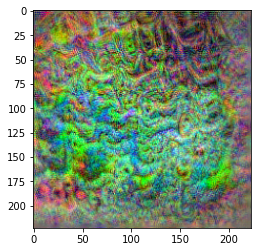

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
2
begin mag_epoch 0, activation: 0.36433666944503784
begin mag_epoch 5, activation: 7.519930839538574
begin mag_epoch 10, activation: 7.345789432525635
begin mag_epoch 15, activation: 11.164020538330078
begin mag_epoch 20, activation: 10.74654769897461


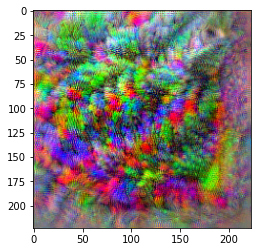

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
3
begin mag_epoch 0, activation: 0.6045483946800232
begin mag_epoch 5, activation: 4.401954650878906
begin mag_epoch 10, activation: 4.892210483551025
begin mag_epoch 15, activation: 3.3558144569396973
begin mag_epoch 20, activation: 2.6831371784210205


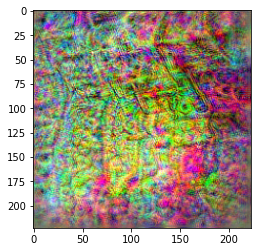

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
4
begin mag_epoch 0, activation: 0.8351858854293823
begin mag_epoch 5, activation: 6.7914228439331055
begin mag_epoch 10, activation: 6.146766185760498
begin mag_epoch 15, activation: 6.389051914215088
begin mag_epoch 20, activation: 5.341010570526123


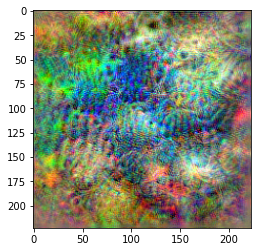

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
5
begin mag_epoch 0, activation: 0.7400890588760376
begin mag_epoch 5, activation: 6.16447639465332
begin mag_epoch 10, activation: 7.80708122253418
begin mag_epoch 15, activation: 9.1237154006958
begin mag_epoch 20, activation: 8.296194076538086


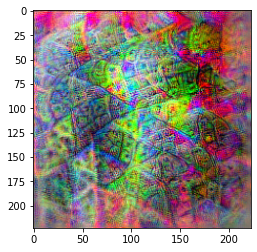

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
6
begin mag_epoch 0, activation: 0.6132821440696716
begin mag_epoch 5, activation: 4.0182929039001465
begin mag_epoch 10, activation: 2.3565280437469482
begin mag_epoch 15, activation: 3.3539645671844482
begin mag_epoch 20, activation: 3.688488483428955


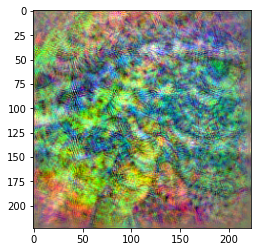

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
7
begin mag_epoch 0, activation: 0.5135908722877502
begin mag_epoch 5, activation: 5.2852888107299805
begin mag_epoch 10, activation: 5.513217449188232
begin mag_epoch 15, activation: 5.964062213897705
begin mag_epoch 20, activation: 5.959643363952637


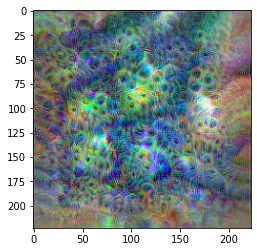

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
8
begin mag_epoch 0, activation: 0.10928910225629807
begin mag_epoch 5, activation: 4.363285541534424
begin mag_epoch 10, activation: 5.277127265930176
begin mag_epoch 15, activation: 5.230781555175781
begin mag_epoch 20, activation: 4.413547039031982


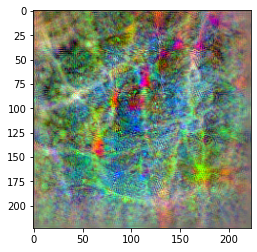

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
9
begin mag_epoch 0, activation: 0.6371182203292847
begin mag_epoch 5, activation: 3.992455005645752
begin mag_epoch 10, activation: 4.733893394470215
begin mag_epoch 15, activation: 4.812921047210693
begin mag_epoch 20, activation: 3.701690912246704


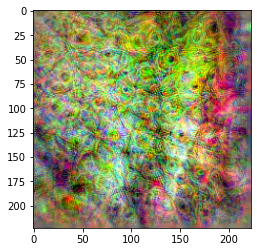

img_shape:torch.Size([3, 80, 80]), img_dtype: torch.float32
10
begin mag_epoch 0, activation: 1.1232699155807495
begin mag_epoch 5, activation: 8.073080062866211
begin mag_epoch 10, activation: 7.141288757324219
begin mag_epoch 15, activation: 6.989752769470215
begin mag_epoch 20, activation: 5.61021089553833


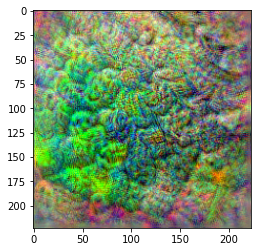

In [290]:
unit_idx = 0 # the neuron to visualize
act_wt = 0.75 # factor by which to weigh the activation relative to the regulizer terms

upscaling_steps = 20 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 40 #20 # no. of times to optimize an input image before upscaling


model.eval()

for unit_idx in range(1,11,1):
    img_tensor = random_image(Height =80, Width = 80, device = device, requires_grad = True )
    print(unit_idx)
    for mag_epoch in range(upscaling_steps+1):
        optimizer = optim.Adam([img_tensor], lr = 0.4)

        for opt_epoch in range(optim_steps):
            optimizer.zero_grad()
            model(img_tensor.unsqueeze(0))
            layer_out = activation[layer_name]

            rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
            #rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                sys.exit()

            # pixel intensity
            pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
            # terminate if pxl_inty is nan
            if torch.isnan(pxl_inty):
                print('Error: Pixel Intensity was Nan; Terminating ...')
                sys.exit()

            # image gradients
            im_grd = grad_loss(img_tensor, beta = 1, device = device)
            # terminate is im_grd is nan
            if torch.isnan(im_grd):
                print('Error: image gradients were Nan; Terminating ...')
                sys.exit()

            loss = -act_wt*rms + pxl_inty + im_grd        
            # print activation at the beginning of each mag_epoch
            if opt_epoch == 0 and mag_epoch%5==0:
                print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
            loss.backward()
            optimizer.step()

        img = image_converter(img_tensor)      
        # view the result of optimising the image
        #if mag_epoch==0:
        #    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, rms))
        #    plt.imshow(img)
        #    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
        #    plt.show()

        # scale up and move the color axis to be the first
        img = cv2.resize(img, dsize = (0,0), 
                         fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) 
        img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

    img = image_converter(img_tensor)
    plt.imshow(img)
    plt.savefig('test_%s_%d.png' % (layer_name, unit_idx), bbox_inches='tight')
    plt.show()
#[1, 192, 21, 21]) torch.Size([1, 64, 10, 10]) torch.Size([1, 192, 4, 4])

In [277]:
# generating the initial image with random pixel values between 0 and 1
H = 150 #224 # height of input image
W = 150 #224 # width of input image
img_tensor, optimizer = random_image(Height = H, Width = W, device = device, 
                                     requires_grad = True, optimizer = optim.Adam, lr = 0.4)

img_shape:torch.Size([3, 150, 150]), img_dtype: torch.float32


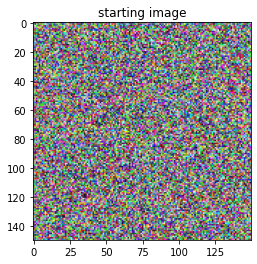

In [278]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [279]:
# understanding the shape of the output produced by a given layer
image = img_tensor.clone().detach().to(device).requires_grad_(True)
model(image.unsqueeze(0))
activation[layer_name].shape

torch.Size([1, 192, 7, 7])

epoch: 0/1000, activation: -0.21840640902519226


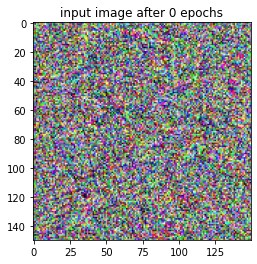

epoch: 50/1000, activation: 12.069660186767578


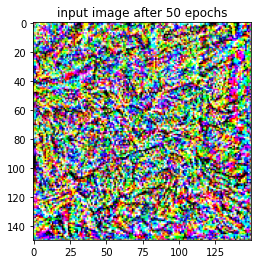

epoch: 100/1000, activation: 14.446945190429688


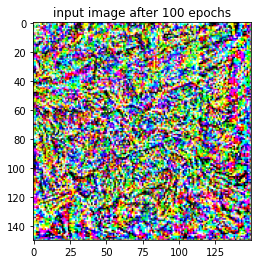

epoch: 150/1000, activation: 15.709288597106934


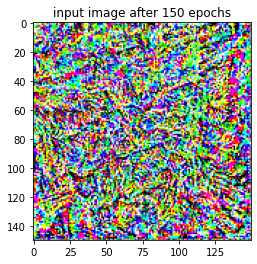

epoch: 200/1000, activation: 16.459732055664062


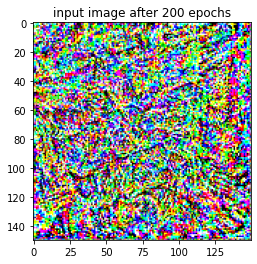

epoch: 250/1000, activation: 17.23075294494629


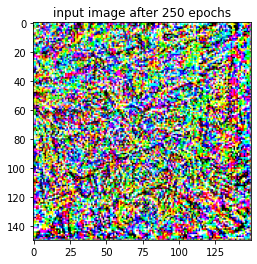

epoch: 300/1000, activation: 18.000364303588867


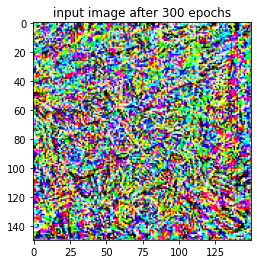

epoch: 350/1000, activation: 18.344356536865234


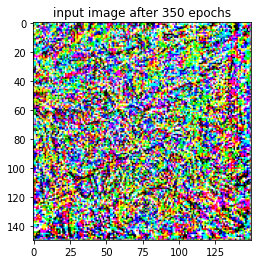

epoch: 400/1000, activation: 18.88770866394043


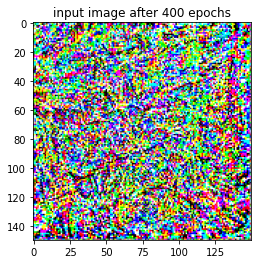

epoch: 450/1000, activation: 19.381969451904297


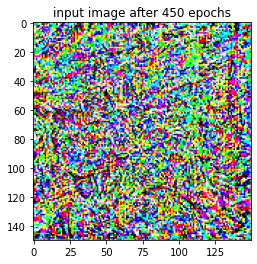

epoch: 500/1000, activation: 19.654556274414062


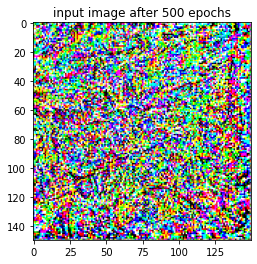

epoch: 550/1000, activation: 20.01140785217285


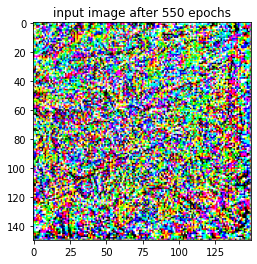

epoch: 600/1000, activation: 20.19552993774414


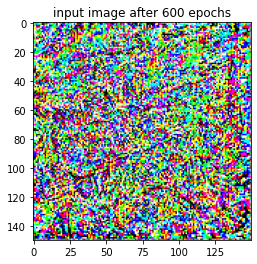

epoch: 650/1000, activation: 20.358142852783203


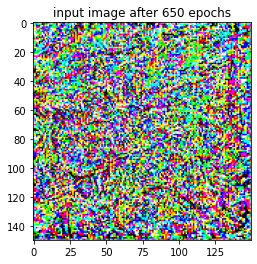

epoch: 700/1000, activation: 20.617496490478516


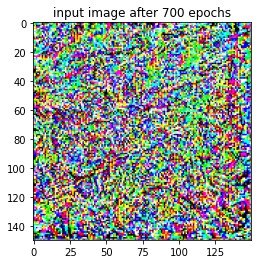

epoch: 750/1000, activation: 20.769845962524414


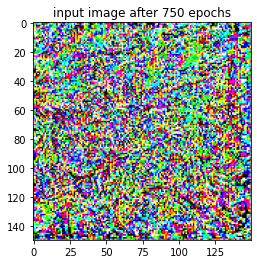

epoch: 800/1000, activation: 20.77370834350586


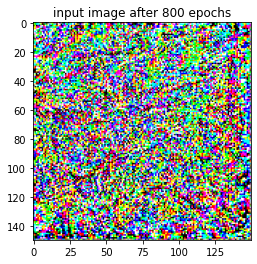

epoch: 850/1000, activation: 21.019981384277344


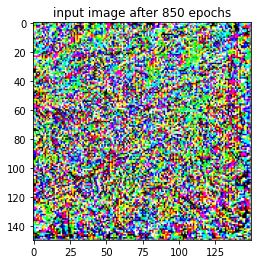

epoch: 900/1000, activation: 21.15318489074707


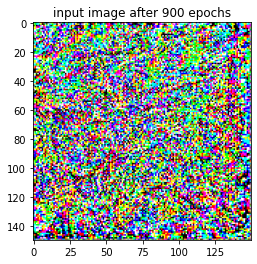

epoch: 950/1000, activation: 21.208354949951172


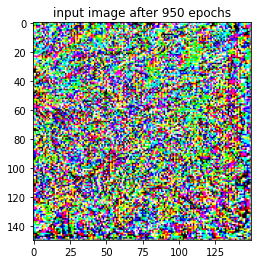

In [280]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()

num_epochs = 1000
display_every = 50
unit_idx = 0 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation[layer_name]
    loss = -layer_out[0, unit_idx].mean() 
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()

In [281]:
# Use cv2 to compute image gradients
# This is to verify our implementation of image gradients using conv. layers
# We can not be use these during backpropagation, hence the need to define our own function
# Due to differences in how boundary pixels are handled we only expect the results to match for non-boundary pixels


# function to compute image gradients using cv2
# we will make use of the Scharr filters provided in cv2
# the image passed to this function is supposed to have the color channels as its first dimension
def image_gradients(img):
    num_channels = img.shape[0]
    ddepth = cv2.CV_64F
    x_grad = []
    y_grad = []
    for chnl in range(num_channels):
        x_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 1, dy = 0))
        y_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 0, dy = 1))
    x_grad = np.single(np.array(x_grad))
    y_grad = np.single(np.array(y_grad))
    return x_grad, y_grad

In [283]:
# class to compute image gradients in pytorch
class gradients(nn.Module):
    def __init__(self, weight):
        super().__init__()
        k_height, k_width = weight.shape[2:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 2 output channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(1, 2, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        if self.conv.weight.shape == weight.shape:
            self.conv.weight = nn.Parameter(weight)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    def forward(self, x):
        return self.conv(x)    

In [284]:
gradLayer = gradients(torch.from_numpy(grad_filters).unsqueeze(1).type(torch.FloatTensor))
gradLayer

gradients(
  (conv): Conv2d(1, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)

In [77]:
i=0
ttl=0
for name, param in model.named_parameters():
    if '.conv.' in name.lower():
        ttl+=param.size()[1]
        print(param.size()[1], name)
        i+=1
i, ttl

3 Conv2d_1a_3x3.conv.weight
32 Conv2d_2a_3x3.conv.weight
32 Conv2d_2b_3x3.conv.weight
64 Conv2d_3b_1x1.conv.weight
80 Conv2d_4a_3x3.conv.weight
192 Mixed_5b.branch1x1.conv.weight
192 Mixed_5b.branch5x5_1.conv.weight
48 Mixed_5b.branch5x5_2.conv.weight
192 Mixed_5b.branch3x3dbl_1.conv.weight
64 Mixed_5b.branch3x3dbl_2.conv.weight
96 Mixed_5b.branch3x3dbl_3.conv.weight
192 Mixed_5b.branch_pool.conv.weight
256 Mixed_5c.branch1x1.conv.weight
256 Mixed_5c.branch5x5_1.conv.weight
48 Mixed_5c.branch5x5_2.conv.weight
256 Mixed_5c.branch3x3dbl_1.conv.weight
64 Mixed_5c.branch3x3dbl_2.conv.weight
96 Mixed_5c.branch3x3dbl_3.conv.weight
256 Mixed_5c.branch_pool.conv.weight
288 Mixed_5d.branch1x1.conv.weight
288 Mixed_5d.branch5x5_1.conv.weight
48 Mixed_5d.branch5x5_2.conv.weight
288 Mixed_5d.branch3x3dbl_1.conv.weight
64 Mixed_5d.branch3x3dbl_2.conv.weight
96 Mixed_5d.branch3x3dbl_3.conv.weight
288 Mixed_5d.branch_pool.conv.weight
288 Mixed_6a.branch3x3.conv.weight
288 Mixed_6a.branch3x3dbl_1.conv

(94, 40227)

In [54]:
layers = [op.name for op in graph.get_operations() if op.type=='Conv2D' and 'import/' in op.name]
feature_nums = [int(graph.get_tensor_by_name(name+':0').get_shape()[-1]) for name in layers]

array([[[0.4805818 , 0.44873476, 0.49907377, ..., 0.49855027,
         0.5021161 , 0.5061222 ],
        [0.498267  , 0.46464336, 0.48962194, ..., 0.5087924 ,
         0.5082403 , 0.5093287 ],
        [0.46996576, 0.4664721 , 0.51607585, ..., 0.48867255,
         0.5072889 , 0.5104455 ],
        ...,
        [0.47871628, 0.49890384, 0.49891338, ..., 0.48477626,
         0.49109915, 0.4915899 ],
        [0.46887803, 0.4854022 , 0.4982251 , ..., 0.4823824 ,
         0.47500357, 0.4725398 ],
        [0.47769377, 0.4752635 , 0.4980946 , ..., 0.4759303 ,
         0.4662136 , 0.47546673]],

       [[0.4511963 , 0.4080944 , 0.5009674 , ..., 0.4231024 ,
         0.43279675, 0.4505138 ],
        [0.44282144, 0.4952086 , 0.47587812, ..., 0.48055646,
         0.4639963 , 0.44732517],
        [0.42433307, 0.48020723, 0.4562874 , ..., 0.4766358 ,
         0.4743295 , 0.47419748],
        ...,
        [0.47159952, 0.43961626, 0.43429506, ..., 0.4457579 ,
         0.46721783, 0.479913  ],
        [0.4

In [ ]:
def new_img(input_image, scale_factor=-1, mode='bilinear'):
    img = input_image.clone()
    
    if scale_factor != -1:
        img = resize_tensor(img, scale_factor, mode)
        
    return nn.Parameter(img)


def resize_tensor(tensor, size, mode='bilinear'):
    return torch.nn.functional.interpolate(tensor.clone(), size=size, mode=mode, align_corners=True)

In [ ]:
def tile_image(img, tile_size, overlap_percent, info_only=False):
    tile_coords, tile_size, _ = tile_setup(tile_size, overlap_percent, (img.size(2), img.size(3)))
    
    if not info_only:
        return get_tiles(img, tile_coords, tile_size)
    else:
        tile_size = get_tiles(img, tile_coords, tile_size, info_only)
        return tile_size[0], tile_size[1], (len(tile_coords[0]), len(tile_coords[1])), (len(tile_coords[0]) * len(tile_coords[1]))
    
    
def tile_setup(tile_size, overlap_percent, base_size):
    if type(tile_size) is not tuple and type(tile_size) is not list:
        tile_size = (tile_size, tile_size)
        
    if type(overlap_percent) is not tuple and type(overlap_percent) is not list:
        overlap_percent = (overlap_percent, overlap_percent)
        
    x_coords = get_tile_coords(base_size[1], tile_size[1], overlap_percent[1])
    y_coords = get_tile_coords(base_size[0], tile_size[0], overlap_percent[0])
    
    y_ovlp, x_ovlp = int(tile_size[0] * overlap_percent[0]), int(tile_size[1] * overlap_percent[1])
    
    return (y_coords, x_coords), tile_size, [y_ovlp, y_ovlp, x_ovlp, x_ovlp]


def get_tile_coords(d, tile_dim, overlap=0):
    move = int(tile_dim * (1-overlap))
    
    c, tile_start, coords = 1, 0, [0]
    while tile_start + tile_dim < d:
        tile_start = move * c
        
        if tile_start + tile_dim >= d:
            coords.append(d - tile_dim)
        else:
            coords.append(tile_start)
            
        c += 1
        
    return coords


def get_tiles(img, tile_coords, tile_size, info_only=False):
    tile_list = []
    for y in tile_coords[0]:
        for x in tile_coords[1]:
            tile = img[:, :, y:y+tile_size[0], x:x+tile_size[1]]
            tile_list.append(tile)
            
    if not info_only:
        return tile_list
    else:
        return tile_list[0].size(2), tile_list[0].size(3)

In [ ]:
overlap_percent = params.overlap_percent / 100 if params.overlap_percent > 1 else params.overlap_percent
tile_height, tile_width, tile_pattern, num_tiles = tile_image(base_img.clone(), params.tile_size, overlap_percent, True)

print('\nCreated ' + str(num_tiles) + ' tiles')
print('Tile pattern: ' + str(tile_pattern[0]) + 'x' + str(tile_pattern[1]))

In [ ]:
def octave_calc(image_size, octave_scale, num_octaves, mode='normal'):
    octave_list = []
    h_size, w_size = image_size[0], image_size[1]
    
    octave_scale = float(octave_scale)

    if mode == 'normal':
        for o in range(1, num_octaves+1):
            h_size *= octave_scale
            w_size *= octave_scale
            
            if o < num_octaves:
                octave_list.append((int(h_size), int(w_size)))
                
        octave_list.reverse()
        octave_list.append((image_size[0], image_size[1]))
        
    elif mode == 'advanced':
        for o in range(1, num_octaves+1):
            h_size = image_size[0] * (o * octave_scale)
            w_size = image_size[1] * (o * octave_scale)
            
            octave_list.append((int(h_size), int(w_size)))
            
    return octave_list

In [ ]:
octave_list = octave_calc((tile_height, tile_width), params.octave_scale, params.num_octaves, params.octave_mode)
octave_list

In [ ]:
# Run inception modules with preprocessing layers
class ModelPlus(nn.Module):

    def __init__(self, input_net, net):
        super(ModelPlus, self).__init__()
        self.input_net = input_net
        self.net = net

    def forward(self, input):
        return self.net(self.input_net(input))
    
    
def roll_tensor(tensor, h_shift=None, w_shift=None):
    if h_shift == None:
        h_shift = torch.LongTensor(10).random_(-tensor.size(1), tensor.size(1))[0].item()
    if w_shift == None:
        w_shift = torch.LongTensor(10).random_(-tensor.size(2), tensor.size(2))[0].item()
        
    tensor = torch.roll(torch.roll(tensor, shifts=h_shift, dims=2), shifts=w_shift, dims=3)
    
    return tensor, h_shift, w_shift


# Reapply DreamLoss layer hooks
def renew_net(start_params, net, loss_module_list, dream_layers):
    start_net, tv_losses, l2_losses = start_network(*start_params)
    
    if isinstance(net, dream_utils.ModelPlus):
        net = net.net
        
    new_dream_losses = []
    sn=0
    for i, layer in enumerate(dream_layers):
        n = layer
        
        loss_module = loss_module_list[i]
        if str(loss_module).split('(')[0] == 'DreamLossPreHook':
            module_loc = 'before'
        else:
            module_loc = 'after'
            
        loss_module, sn = add_to_incept(net, n, sn, loss_module, module_loc)
        new_dream_losses.append(loss_module_list[i])
        
    if len(start_net) > 0:
        net = ModelPlus(start_net, net)
        
    return net, new_dream_losses, tv_losses, l2_losses


# Register DreamLoss layers as hooks on model
def add_to_incept(net, layer_name, layer_num, loss_module, capture='after'):
    if len(layer_name) == 1:
        if capture == 'after':
            getattr(net, layer_name[0]).register_forward_hook(loss_module)
        elif capture == 'before':
            getattr(net, layer_name[0]).register_forward_pre_hook(loss_module)
            
    elif len(layer_name) == 2:
        if isinstance(getattr(getattr(net, layer_name[0]), layer_name[1]), nn.Sequential):
            if capture == 'after':
                getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), str(layer_num)).register_forward_hook(loss_module)
            elif capture == 'before':
                getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), str(layer_num)).register_forward_pre_hook(loss_module)
            layer_num = layer_num+1 if layer_num < 1 else 0
        else:
            if capture == 'after':
                getattr(getattr(net, layer_name[0]), layer_name[1]).register_forward_hook(loss_module)
            elif capture == 'before':
                getattr(getattr(net, layer_name[0]), layer_name[1]).register_forward_pre_hook(loss_module)
    
    elif len(layer_name) == 3:
        if isinstance(getattr(getattr(net, layer_name[0]), layer_name[1]), nn.Sequential):
            if capture == 'after':
                getattr(getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), str(layer_num)), layer_name[2]).register_forward_hook(loss_module)
            elif capture == 'before':
                getattr(getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), str(layer_num)), layer_name[2]).register_forward_pre_hook(loss_module)
            layer_num = layer_num+1 if layer_num < 1 else 0
        else:
            if capture == 'after':
                getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), layer_name[2]).register_forward_hook(loss_module)
            elif capture == 'before':
                getattr(getattr(getattr(net, layer_name[0]), layer_name[1]), layer_name[2]).register_forward_pre_hook(loss_module)
    
    return loss_module, layer_num


# Divide weights by channel size
def normalize_weights(dream_losses):
    for n, i in enumerate(dream_losses):
        i.strength = i.strength / max(i.target_size)
        
        
# Adjust tensor contrast
def adjust_contrast(t, r, p=99.98):
    return t * (r / tensor_percentile(t))


# Get tensor percentile
def tensor_percentile(t, p=99.98):
    return t.view(-1).kthvalue(1 + round(0.01 * float(p) * (t.numel() - 1))).values.item()


# Center crop a tensor
def center_crop(input, crop_val, mode='percent'):
       h, w = input.size(2), input.size(3)
       if mode == 'percent':
            h_crop = int((crop_val / 100) * input.size(2))
            w_crop = int((crop_val / 100) * input.size(3))
       elif mode == 'pixel':
            h_crop = input.size(2) - crop_val
            w_crop = input.size(3) - crop_val
       sw, sh = w // 2 - (w_crop // 2), h // 2 - (h_crop // 2)
       return input[:, :, sh:sh + h_crop, sw:sw + w_crop]


# Center crop and resize a tensor
def zoom(input, crop_val, mode='percent'):
    h, w = input.size(2), input.size(3)
    
    input = center_crop(input.clone(), crop_val, mode=mode)
    input = resize_tensor(input, (h,w))
    
    return input

In [ ]:
# Configure the optimizer
def setup_optimizer(img):
    if params.optimizer == 'lbfgs':
        optim_state = {
            'max_iter': params.num_iterations,
            'tolerance_change': -1,
            'tolerance_grad': -1,
            'lr': params.learning_rate
        }
        
        if params.lbfgs_num_correction != 100:
            optim_state['history_size'] = params.lbfgs_num_correction
        optimizer = optim.LBFGS([img], **optim_state)
        loopVal = 1
        
    elif params.optimizer == 'adam':
        optimizer = optim.Adam([img], lr = params.learning_rate)
        loopVal = params.num_iterations - 1
        
    return optimizer, loopVal

In [ ]:
def rebuild_image(tiles, base_img, tile_size, overlap_percent):
    base_img = torch.zeros_like(base_img)
    
    tile_coords, tile_size, overlap = tile_setup(tile_size, overlap_percent, (base_img.size(2), base_img.size(3)))
    
    return add_tiles(tiles, base_img, tile_coords, tile_size, overlap)


def add_tiles(tiles, base_img, tile_coords, tile_size, overlap):
    f_ovlp = final_overlap(tile_coords)
    
    h, w = tiles[0].size(2), tiles[0].size(3)
    t=0
    column, row, = 0, 0
    
    for y in tile_coords[0]:
        for x in tile_coords[1]:
            mask_sides=''
            c_overlap = overlap.copy()
            
            if row == 0:
                if row == len(tile_coords[0]) - 2:
                    mask_sides += 'bottom-special'
                    c_overlap[1] = f_ovlp[0] # Change bottom overlap
                else:
                    mask_sides += 'bottom'
                    
            elif row > 0 and row < len(tile_coords[0]) -2:
                mask_sides += 'bottom,top'
                
            elif row == len(tile_coords[0]) - 2:
                if f_ovlp[0] > 0:
                    mask_sides += 'bottom-special,top'
                    c_overlap[1] = f_ovlp[0] # Change bottom overlap
                elif f_ovlp[0] <= 0:
                    mask_sides += 'bottom,top'
                    
            elif row == len(tile_coords[0]) -1:
                if f_ovlp[0] > 0:
                    mask_sides += 'top-special'
                    c_overlap[0] = f_ovlp[0] # Change top overlap
                elif f_ovlp[0] <= 0:
                    mask_sides += 'top'

            if column == 0:
                if column == len(tile_coords[1]) -2:
                    mask_sides += ',right-special'
                    c_overlap[2] = f_ovlp[1] # Change right overlap
                else:
                    mask_sides += ',right'
                    
            elif column > 0 and column < len(tile_coords[1]) -2:
                mask_sides += ',right,left'
                
            elif column == len(tile_coords[1]) -2:
                if f_ovlp[1] > 0:
                    mask_sides += ',right-special,left'
                    c_overlap[2] = f_ovlp[1] # Change right overlap
                elif f_ovlp[1] <= 0:
                    mask_sides += ',right,left'
                    
            elif column == len(tile_coords[1]) -1:
                if f_ovlp[1] > 0:
                    mask_sides += ',left-special'
                    c_overlap[3] = f_ovlp[1] # Change left overlap
                elif f_ovlp[1] <= 0:
                    mask_sides += ',left'

            tile = mask_tile(tiles[t], c_overlap, side=mask_sides)
            
            base_img[:, :, y:y+tile_size[0], x:x+tile_size[1]] = base_img[:, :, y:y+tile_size[0], x:x+tile_size[1]] + tile
            
            t+=1
            column+=1
            
        row+=1
        column=0
        
    return base_img


def final_overlap(tile_coords):
    r, c = len(tile_coords[0]), len(tile_coords[1])
    
    return (tile_coords[0][r-1] - tile_coords[0][r-2], tile_coords[1][c-1] - tile_coords[1][c-2])


# Apply blend masks to tiles
def mask_tile(tile, overlap, side='bottom'):
    h, w = tile.size(2), tile.size(3)
    top_overlap, bottom_overlap, right_overlap, left_overlap = overlap[0], overlap[1], overlap[2], overlap[3]
    
    if tile.is_cuda:
        if 'left' in side and 'left-special' not in side:
            lin_mask_left = torch.linspace(0,1,left_overlap, device=tile.get_device()).repeat(h,1).repeat(3,1,1).unsqueeze(0)
            
        if 'right' in side and 'right-special' not in side:
            lin_mask_right = torch.linspace(1,0,right_overlap, device=tile.get_device()).repeat(h,1).repeat(3,1,1).unsqueeze(0)
            
        if 'top' in side and 'top-special' not in side:
            lin_mask_top = torch.linspace(0,1,top_overlap, device=tile.get_device()).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)
        
        if 'bottom' in side and 'bottom-special' not in side:
            lin_mask_bottom = torch.linspace(1,0,bottom_overlap, device=tile.get_device()).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)

        if 'left-special' in side:
            lin_mask_left = torch.linspace(0,1,left_overlap, device=tile.get_device())
            zeros_mask = torch.zeros(w-(left_overlap*2), device=tile.get_device())
            ones_mask = torch.ones(left_overlap, device=tile.get_device())
            lin_mask_left = torch.cat([zeros_mask, lin_mask_left, ones_mask], 0).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'right-special' in side:
            lin_mask_right = torch.linspace(1,0,right_overlap, device=tile.get_device())
            ones_mask = torch.ones(w-right_overlap, device=tile.get_device())
            lin_mask_right = torch.cat([ones_mask, lin_mask_right], 0).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'top-special' in side:
            lin_mask_top = torch.linspace(0,1,top_overlap, device=tile.get_device())
            zeros_mask = torch.zeros(h-(top_overlap*2), device=tile.get_device())
            ones_mask = torch.ones(top_overlap, device=tile.get_device())
            lin_mask_top = torch.cat([zeros_mask, lin_mask_top, ones_mask], 0).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)
        
        if 'bottom-special' in side:
            lin_mask_bottom = torch.linspace(1,0,bottom_overlap, device=tile.get_device())
            ones_mask = torch.ones(h-bottom_overlap, device=tile.get_device())
            lin_mask_bottom = torch.cat([ones_mask, lin_mask_bottom], 0).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)
    else:
        if 'left' in side and 'left-special' not in side:
            lin_mask_left = torch.linspace(0,1,left_overlap).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'right' in side and 'right-special' not in side:
            lin_mask_right = torch.linspace(1,0,right_overlap).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'top' in side and 'top-special' not in side:
            lin_mask_top = torch.linspace(0,1,top_overlap).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)
        
        if 'bottom' in side and 'bottom-special' not in side:
            lin_mask_bottom = torch.linspace(1,0,bottom_overlap).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)

        if 'left-special' in side:
            lin_mask_left = torch.linspace(0,1,left_overlap)
            zeros_mask = torch.zeros(w-(left_overlap*2))
            ones_mask = torch.ones(left_overlap)
            lin_mask_left = torch.cat([zeros_mask, lin_mask_left, ones_mask], 0).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'right-special' in side:
            lin_mask_right = torch.linspace(1,0,right_overlap)
            ones_mask = torch.ones(w-right_overlap)
            lin_mask_right = torch.cat([ones_mask, lin_mask_right], 0).repeat(h,1).repeat(3,1,1).unsqueeze(0)
        
        if 'top-special' in side:
            lin_mask_top = torch.linspace(0,1,top_overlap)
            zeros_mask = torch.zeros(h-(top_overlap*2))
            ones_mask = torch.ones(top_overlap)
            lin_mask_top = torch.cat([zeros_mask, lin_mask_top, ones_mask], 0).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)
        
        if 'bottom-special' in side:
            lin_mask_bottom = torch.linspace(1,0,bottom_overlap)
            ones_mask = torch.ones(h-bottom_overlap)
            lin_mask_bottom = torch.cat([ones_mask, lin_mask_bottom], 0).repeat(w,1).rot90(3).repeat(3,1,1).unsqueeze(0)

    base_mask = torch.ones_like(tile)

    if 'right' in side and 'right-special' not in side:
        base_mask[:,:,:,w-right_overlap:] = base_mask[:,:,:,w-right_overlap:] * lin_mask_right
    
    if 'left' in side and 'left-special' not in side:
        base_mask[:,:,:,:left_overlap] = base_mask[:,:,:,:left_overlap] * lin_mask_left
    
    if 'bottom' in side and 'bottom-special' not in side:
        base_mask[:,:,h-bottom_overlap:,:] = base_mask[:,:,h-bottom_overlap:,:] * lin_mask_bottom
    
    if 'top' in side and 'top-special' not in side:
        base_mask[:,:,:top_overlap,:] = base_mask[:,:,:top_overlap,:] * lin_mask_top

    if 'right-special' in side:
        base_mask = base_mask * lin_mask_right
    
    if 'left-special' in side:
        base_mask = base_mask * lin_mask_left
    
    if 'bottom-special' in side:
        base_mask = base_mask * lin_mask_bottom
    
    if 'top-special' in side:
        base_mask = base_mask * lin_mask_top
    
    return tile * base_mask

In [ ]:
# Define an nn Module to compute tv loss
class TVLoss(nn.Module):
    def __init__(self, strength):
        super(TVLoss, self).__init__()
        self.strength = strength

    def forward(self, input):
        self.x_diff = input[:,:,1:,:] - input[:,:,:-1,:]
        self.y_diff = input[:,:,:,1:] - input[:,:,:,:-1]
        self.loss = self.strength * (torch.sum(torch.abs(self.x_diff)) + torch.sum(torch.abs(self.y_diff)))
        return input
    
    
# Define an nn Module to compute l2 loss
class L2Regularizer(nn.Module):
    def __init__(self, strength):
        super(L2Regularizer, self).__init__()
        self.strength = strength

    def forward(self, input):
        self.loss = self.strength * (input.clone().norm(3)/2)
        return input

In [ ]:
octave_losses, tile_losses = [], []
for iter in range(1, params.num_iterations+1):
    for octave, octave_sizes in enumerate(octave_list, 1):
        new_tiles = []
        
        if not params.disable_roll:
            current_img, h_roll, w_roll = roll_tensor(current_img.clone())
            
        img_tiles = tile_image(current_img, params.tile_size, overlap_percent)

        for tile_num, tile_img in enumerate(img_tiles):
            net = copy.deepcopy(net_base) if not has_inception else net_base
            
            for param in net.parameters():
                param.requires_grad = False
                
            dream_losses, tv_losses, l2_losses = [], [], []
            if not has_inception:
                for i, layer in enumerate(net):
                    if isinstance(layer, TVLoss):
                        tv_losses.append(layer)
                        
                    if isinstance(layer, L2Regularizer):
                        l2_losses.append(layer)
                        
                    if 'DreamLoss' in str(type(layer)):
                        dream_losses.append(layer)
                        
            elif has_inception:
                net, dream_losses, tv_losses, l2_losses = renew_net(start_params, net, loss_module_list, lm_layer_names)

            tile_img = new_img(tile_img.clone(), octave_sizes)

            net(tile_img)
            for i in dream_losses:
                i.mode = 'loss'

            # Maybe normalize dream weight
            if params.normalize_weights:
                normalize_weights(dream_losses)

            # Freeze the net_basework in order to prevent
            # unnecessary gradient calculations
            for param in net.parameters():
                param.requires_grad = False

            # Function to evaluate loss and gradient. We run the net_base forward and
            # backward to get the gradient, and sum up losses from the loss modules.
            # optim.lbfgs internally handles iteration and calls this function many
            # times, so we manually count the number of iterations to handle printing
            # and saving intermediate results.
            num_calls = [0]
            def feval():
                num_calls[0] += 1
                optimizer.zero_grad()
                net(tile_img)
                loss = 0

                for mod in dream_losses:
                    loss += -mod.loss.to(backward_device)
                    
                if params.tv_weight > 0:
                    for mod in tv_losses:
                        loss += mod.loss.to(backward_device)
                        
                if params.l2_weight > 0:
                    for mod in l2_losses:
                        loss += mod.loss.to(backward_device)

                if params.clamp:
                    tile_img.clamp(0, clamp_val)
                    
                if params.adjust_contrast > -1:
                    tile_img.data = adjust_contrast(tile_img, r=clamp_val, p=params.adjust_contrast)

                total_loss[0] += loss.item()

                loss.backward()
                
                return loss

            optimizer, loopVal = setup_optimizer(tile_img)
            while num_calls[0] <= params.octave_iter:
                optimizer.step(feval)

            for mod in dream_losses:
                tile_losses.append(mod.loss.item())

            if tile_img.size(2) != tile_height or tile_img.size(3) != tile_width:
                tile_img = resize_tensor(tile_img.clone(), (tile_height, tile_width))
                
            new_tiles.append(tile_img)

        current_img = rebuild_image(new_tiles, current_img, params.tile_size, overlap_percent)
        
        if not params.disable_roll:
            current_img, _, _ = roll_tensor(current_img, -h_roll, -w_roll)

        o_start, o_end = 0, len(img_tiles) - 1
        for mod in dream_losses:
            octave_losses.append(sum(tile_losses[o_start:o_end]))
            o_start += len(img_tiles) - 1
            o_end += len(img_tiles) - 1

        for n, o_loss in enumerate(octave_losses):
            if octave == 1:
                total_dream_losses.append(o_loss)
            else:
                total_dream_losses[n] += o_loss

        octave_losses, tile_losses = [], []

    print(iter, total_loss[0], total_dream_losses)
    maybe_save(iter, current_img, content_image, input_mean, output_start_num, params.leading_zeros)
    total_dream_losses, total_loss = [], [0]

    if params.classify > 0:
        if params.image_capture_size == 0:
            feat = net_base(current_img.clone())
        else:
            feat = net_base(resize_tensor(current_img.clone(), (image_capture_size)))
            
        classify_img(feat)
        
    if params.zoom > 0:
        current_img = zoom(current_img, params.zoom, params.zoom_mode)

In [13]:
x = torch.load('%s/x_0.pt' % tensor_path)
y = torch.load('%s/y_0.pt' % tensor_path)

In [14]:
out = inception(x[:10])
out.size()

In [16]:
criterion = nn.CrossEntropyLoss()

In [17]:
loss = criterion(out, y[:10])

In [19]:
_, preds = torch.max(out, 1)
preds

tensor([10, 24, 24, 13, 14, 18, 17, 23, 11,  3])

In [20]:
loss.backward()

In [23]:
optimizer = torch.optim.AdamW(inception.parameters(), lr=0.001)

In [24]:
optimizer.step()

In [136]:
# Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2

tensor([[[ 1.4954, -1.0553,  1.4897],
         [-1.7240,  0.4853,  2.4308],
         [-2.1179, -1.9832, -0.2707]],

        [[-0.2171,  0.6954, -0.2532],
         [-0.0116,  2.2360, -1.0550],
         [-1.9467, -1.6331,  1.4722]]])

In [78]:
 if we are feature extracting and only want to compute gradients for the newly initialized layer then we want all of the other parameters to not require gradients. This will make more sense later.

def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

196.92307692307693

(196, 128, 3)

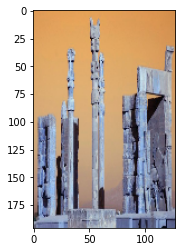

In [83]:
plt.imshow(resized_im)
plt.show()